<a href="https://colab.research.google.com/github/NoelleI/AI-Experiments-Pigmentation/blob/master/Pigmentation_EXP1_cleaned_up.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Melanoma with CNN

This analysis trains a neural network to perform segmentation on melanoma data and then applies the algorithm to segment a pigmentation lesion

This line clones the github repository so that data may be accessed and the file can be saved there

In [1]:
!git clone https://github.com/NoelleI/Pigmentation.git

fatal: destination path 'Pigmentation' already exists and is not an empty directory.


This mounts Google Drive to access the ~10G melanoma photo data sets

1.   List item
2.   List item



In [2]:
from google.colab import drive
drive.mount('/content/gdrive', force_remount=True) 

Mounted at /content/gdrive


Import Packages with required versions

In [3]:
import tensorflow as tf
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os
%matplotlib inline


In [0]:
import skimage
from skimage import transform

In [0]:
import numpy as np


In [6]:
import scipy
scipy.__version__

'1.0.0'

In [7]:
!pip install pillow

In [0]:
if not (scipy.__version__ == '1.0.0'):
  !pip uninstall scipy==1.3.0
  !pip install scipy==1.0.0

In [0]:
 
from skimage import data
from skimage.color import rgb2hsv, rgb2lab

Get Pigmentation Photos

In [10]:
from scipy import ndimage, misc
import re
import os
from datetime import datetime

pigs = []
filenames_dict = {}
str = "./Pigmentation/Pigmentation_photos/Experiment 1/Spot 4"    #photo directory on cloned repository for experimental pigmentation data


for root, dirnames, filenames in os.walk(str): 
    #print(filenames)
    for filename in filenames:
           # print(filename, "\n")
      #if re.search('d*[^{r|f}].jpg', filename):
            #n =  re.match("(.*)(2019)(\d*_\d*)_(.*)", filename)
            #key = n.group(3)

            #key = datetime.strptime(key, '%m%d_%H%M%S')
           # print(key, " ")
           # print(filename, "\n")
            #print(os.path.join(root, filename), "\n")
            #filenames_dict.update({key: os.path.join(root, filename)})
            #print(filenames_dict, "\n\n")
            n = re.match("(\d*)", filename)
            #print(n.group(), " ")
            #print(filename, "\n")
            #print(os.path.join(root, filename), "\n")
            filenames_dict.update({int(n.group()): os.path.join(root, filename)})
            #print(filenames_dict, "\n\n")
#print(filenames_dict.keys(),"\n")
for key in sorted(filenames_dict.keys()):
  #print(key,filenames_dict[key], "\n")
  image = ndimage.imread(filenames_dict[key], mode="RGB")
  image = skimage.transform.resize(image, (192,256,3))  
  
  pigs+= [image]
  
  
pigs = np.asarray(pigs)
            



/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:34: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0.
Use ``matplotlib.pyplot.imread`` instead.


Retrieve unordered filenames for Melanoma training set from directory using os

In [0]:
from scipy import ndimage, misc
import re
import os
#there are 2594 photos
filenames_dict = {}
for root, dirnames, filenames in os.walk("/content/gdrive/My Drive/Batches/ISIC2018_Task1-2_Training_Input_batches"): #/content/gdrive/My Drive/ISIC2018_Task1-2_Training_Input/ISIC2018_Task1-2_Training_Input"):
    for filename in filenames:
      if re.search('d*[^{r|f}].jpg', filename):
            n = re.match("ISIC_(\d*).", filename)
            filenames_dict.update({n.group(1): os.path.join(root, filename)})
           
           
for root, dirnames, filenames in os.walk("/content/gdrive/My Drive/Batches/ISIC2018_Task1-2_Testing_Input_batches"): #/content/gdrive/My Drive/ISIC2018_Task1-2_Training_Input/ISIC2018_Task1-2_Training_Input"):
    for filename in filenames:
      if re.search('d*[^{r|f}].jpg', filename):
            n = re.match("ISIC_(\d*).", filename)
            filenames_dict.update({n.group(1): os.path.join(root, filename)})


In [0]:
#"/content/gdrive/My Drive/Batches/ISIC2018_Task1_Training_GroundTruth_batches"

from scipy import ndimage, misc
import re
import os
#there are 2594 photos
labelnames_dict = {}
for root, dirnames, filenames in os.walk("/content/gdrive/My Drive/Batches/ISIC2018_Task1_Training_GroundTruth_batches"): #/content/gdrive/My Drive/ISIC2018_Task1-2_Training_Input/ISIC2018_Task1-2_Training_Input"):
    for filename in filenames:
      if re.search('d*[^{r|f}]_segmentation.png', filename):
           
            n = re.match("ISIC_(\d*)_\w+", filename)
            labelnames_dict.update({n.group(1): os.path.join(root, filename)})
           
for root, dirnames, filenames in os.walk("/content/gdrive/My Drive/Batches/ISIC2018_Task1_Testing_GroundTruth_batches"): #/content/gdrive/My Drive/ISIC2018_Task1-2_Training_Input/ISIC2018_Task1-2_Training_Input"):
    for filename in filenames:
      if re.search('d*[^{r|f}]_segmentation.png', filename):
            n = re.match("ISIC_(\d*)_\w+", filename)
            labelnames_dict.update({n.group(1): os.path.join(root, filename)})
            

Order the photos using dictionary sorting

In [13]:
images = []
segs = []
for key in sorted(labelnames_dict.keys()):
  image = ndimage.imread(filenames_dict[key], mode="RGB")
  seg = ndimage.imread(labelnames_dict[key], mode="L")
  images += [image]
  segs += [seg]
  
images = np.array(images)
segs = np.array(segs)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:4: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0.
Use ``matplotlib.pyplot.imread`` instead.
  after removing the cwd from sys.path.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: DeprecationWarning: `imread` is deprecated!
`imread` is deprecated in SciPy 1.0.0.
Use ``matplotlib.pyplot.imread`` instead.
  """


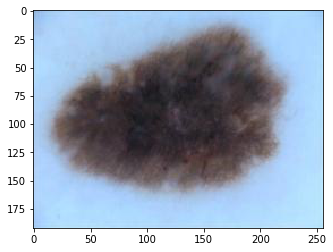

In [14]:
image = images[0,:,:,:]
plt.imshow(image)
plt.show()

### Helper Functions

Function to help intialize random weights for fully connected or convolutional layers and deconvolutional layers

In [0]:
from sklearn.model_selection import train_test_split
trainim, testim, trainlab, testlab = train_test_split(images, segs, test_size = 0.05) #this is randomized each time the program is started and run from scratch

In [16]:
trainim.shape

(2464, 192, 256, 3)

In [17]:
np.max(testlab)

255

In [18]:
testlab.shape

(130, 192, 256)

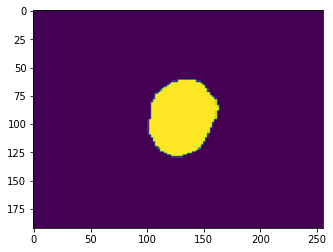

In [19]:
image = trainlab[0,:,:]
plt.imshow(image)
plt.show()

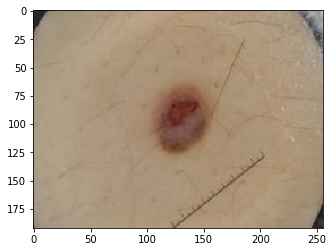

In [20]:
image = trainim[0,:,:,:]
plt.imshow(image)
plt.show()

In [0]:
def data_augmentations(features,lables,flag):
  if flag:
    #print("treat the first input image")
    #hsv_img = rgb2hsv(features[0])  #add 3 hsv channels       
    #plt.imshow(features[0])
    #plt.show()
    #plt.imshow(hsv_img)
    #plt.show()
    #print(hsv_img.dtype)
    #print(features[0].dtype)
    #print(hsv_img)
    #print(features[0])
    #l = rgb2lab(features[0])[:,:,0].reshape(192,256,1) #add the l channel from the lab space
    #image = np.concatenate((features[0]/255,hsv_img,l), axis =2)  #concatenate into one big image
    x2 = features[0].reshape([1,192,256,3]) #image.reshape([1,192,256,7])  #need to add "1" to first dimension for future concatenation
    image = features[0]
    #print("#flip the first image:")
    flip_ud_x2 = np.flipud(image).reshape([1,192,256,3])
    #plt.imshow(flip_ud_x2[0,:,:,:3])
   
    #plt.show()
    x2 = np.vstack((x2, flip_ud_x2)) 
    
    #print("#rotate the first image by a random angle")
    ra = np.random.random()*360
    rotate_x2 = ndimage.rotate(image, ra)
    #print(image)
    #print(rotate_x2)
    #plt.imshow(rotate_x2[:,:,:3])
    #plt.show()
    #print("test1")
    rotate_x2 = skimage.transform.resize(rotate_x2, (1,192,256,3))
    #plt.imshow(rotate_x2[0,:,:,:3])
    #print("test2")
    x2 = np.vstack((x2, rotate_x2 )) 
    
    #print("#treat the first label:")
    label = lables[0]
    #plt.imshow(label)
    #plt.show()
    y2 = label.reshape([1,192,256,1])
    #print("#flip the first label to match the first input image:")
    flip_ud_y2 = np.flipud(label).reshape([1,192,256,1])
    y2 = np.vstack((y2, flip_ud_y2)) 
    #plt.imshow(flip_ud_y2[0:,:,:,:])
    #plt.show()
    #print("#rotate the label by the same angle as the image")
    rotate_y2 = ndimage.rotate(label, ra)
    rotate_y2 = skimage.transform.resize(rotate_y2, (1,192,256,1))
    y2 = np.vstack((y2, rotate_y2)) 
    #plt.imshow(rotate_y2) 
    #plt.show()
  
    i = 1
    
    #print('#treat the subsequent images and labels')
    for image in features[1:]:
      #print(i)
      #plt.imshow(image)
      #plt.show()
      #hsv_img = rgb2hsv(image)  #add 3 hsv channels       
      #plt.imshow(hsv_img)
      #plt.show()
      #l = rgb2lab(image)[:,:,0].reshape(192,256,1) #add the l channel from the lab space
      #image = np.concatenate((image,hsv_img,l), axis =2)  #concatenate into one big image
      image2 = image.reshape([1,192,256,3])  #need to add "1" to first dimension for future concatenation
      
      x2 = np.vstack((x2, image2))
      #print('#flip the image:')
      flip_ud_x2 = np.flipud(image).reshape([1,192,256,3])
      x2 = np.vstack((x2, flip_ud_x2))
      #plt.imshow(flip_ud_x2[1,:,:,:3])
      #plt.show()
     
      #print('#rotate the image by a random angle')
      ra = np.random.random()*360
      rotate_x2 = ndimage.rotate(image, ra)
      rotate_x2 = skimage.transform.resize(rotate_x2, (1,192,256,3))
      x2 = np.vstack((x2, rotate_x2))
      #plt.imshow(rotate_x2[0,:,:,:3])
      #plt.show()
      
     
      #print('#treat the corresponding label:')
      label = lables[i]
      label2 = lables[i].reshape([1,192,256,1])
      #plt.imshow(label)
      #plt.show()
     
      y2 = np.vstack((y2,label2))
      #print('#flip the corresponding label to match the input image:')
      flip_ud_y2 = np.flipud(label).reshape([1,192,256,1])
      y2 = np.vstack((y2,flip_ud_y2))
      #plt.imshow(flip_ud_y2[0,:,:,:])
      #plt.show()
      
      
      #print('#rotate the label by the same angle as the image')
      rotate_y2 = ndimage.rotate(label, ra)
      rotate_y2 = skimage.transform.resize(rotate_y2, (1,192,256,1))
      y2 = np.vstack((y2,rotate_y2))
      #plt.imshow(rotate_y2) 
      #plt.show()
      
      #print('#scale images to 0-1 interval')
    x2 = x2/255
    y2 = y2/255
  else:
     x2 = features/255
     y2 = lables/255
  return x2, y2

In [0]:
class MelHelper():
    
    def __init__(self):
        self.i = 0
        
        ####Can probably eliminate this part ####
        
        # Grabs a list of all the data batches for training
        #self.all_train_batches = [data_batch1,data_batch2,data_batch3,data_batch4,data_batch5]
        # Grabs a list of all the test batches (really just one batch)
        #self.test_batch = [test_batch]
        
        ###eliminate####
        
        # Intialize some empty variables for later on
        self.training_images = None
        self.training_labels = None
        
        self.test_images = None
        self.test_labels = None
    
    def set_up_images(self):
        
        print("Setting Up Training Images and Labels")
       
        self.training_images = trainim   #normalize only ->replace with images with training set later
                                #self.training_images.reshape(train_len,3,32,32).transpose(0,2,3,1)/255
       
        self.training_labels = np.around(trainlab) #one_hot_encode(np.hstack([d[b"labels"] for d in self.all_train_batches]), 10)
        
        print("Setting Up Test Images and Labels")
        self.test_images, labls = data_augmentations(testim, testlab,0)
        
        self.test_labels = labls.reshape((labls.shape[0],192,256))
       
        
    def next_batch(self, batch_size):
        # Note that the 100 dimension in the reshape call is set by an assumed batch size of 100 - this is now a mistake
        xtra = (self.i + batch_size) % len(self.training_images)
        if xtra<batch_size and xtra != 0:
            x = np.vstack((self.training_images[self.i:self.i+batch_size], self.training_images[0:xtra])) #.reshape(100,32,32,3) 
            y = np.vstack((self.training_labels[self.i:self.i+batch_size], self.training_labels[0:xtra]))
        else:
            x = self.training_images[self.i:self.i+batch_size] #.reshape(100,32,32,3) 
            y = self.training_labels[self.i:self.i+batch_size]
        #print(x.shape)
        x,y = data_augmentations(x,y,0)
        y = y.reshape((y.shape[0],192,256))
        self.i = xtra 
        return x, y

In [0]:
def init_weights(shape):
    init_random_dist = tf.truncated_normal(shape, stddev=0.1)
    return tf.Variable(init_random_dist)

Same as init_weights, but for the biases

In [0]:

def init_bias(shape):
    init_bias_vals = tf.constant(0.1, shape=shape)
    return tf.Variable(init_bias_vals)

Create a 2D convolution using builtin conv2d from TF. From those docs:

Computes a 2-D convolution given 4-D `input` and `filter` tensors.

Given an input tensor of shape `[batch, in_height, in_width, in_channels]`
and a filter / kernel tensor of shape
`[filter_height, filter_width, in_channels, out_channels]`, this op
performs the following:

1. Flattens the filter to a 2-D matrix with shape
   `[filter_height * filter_width * in_channels, output_channels]`.
2. Extracts image patches from the input tensor to form a *virtual*
   tensor of shape `[batch, out_height, out_width,
   filter_height * filter_width * in_channels]`.
3. For each patch, right-multiplies the filter matrix and the image patch
   vector.


In [0]:
def conv2d(x, W):
    return tf.nn.conv2d(x, W, strides=[1, 1, 1, 1], padding='SAME')

In [0]:
def deconv2d(x, shape):
    return tf.layers.conv2d_transpose(x, shape[3], shape[0:2], padding = 'SAME')

In [0]:
def max_pool_2by2(x):
    return tf.nn.max_pool(x, ksize=[1, 2, 2, 1], 
                          strides=[1, 2, 2, 1], padding='SAME')

Using the conv2d function, we'll return an actual convolutional layer here that uses an ReLu activation.

In [0]:
def convolutional_layer(input_x, shape, tr):
    if tr==1:
      training = False
    else: training = True
    W = init_weights(shape)
    b = init_bias([shape[3]])
    c = conv2d(input_x, W) + b   ###put batch normalization here because it should include the weights
    bnc = tf.layers.batch_normalization(c, training = training)
    return tf.nn.relu(bnc)

This is a normal fully connected layer

In [0]:
def normal_full_layer(input_layer, size):
    input_size = int(input_layer.get_shape()[1])
    W = init_weights([input_size, size])
    b = init_bias([size])
    return tf.matmul(input_layer, W) + b

This is a Deconvolutional Layer

In [0]:
def deconvolutional_layer(input_x, shape, tr):
    #W = init_weights(shape)
    if tr==1:
      training = False
    else: training = True
    b = init_bias([shape[3]])  #draw this out to see if it makes sense
    d = deconv2d(input_x, shape) +b
    bnd = tf.layers.batch_normalization(d, training = training)
    return tf.nn.relu(bnd)

Finally, the output layer

In [0]:
def output_layer(input_x, shape):
    #W = init_weights(shape)
    if input_x.shape[0]==1:
      training = False
    else: training = True
    b = init_bias([shape[3]])  
    d = deconv2d(input_x, shape) +b
    
    return tf.nn.sigmoid(d)

In [32]:
images.shape

(2594, 192, 256, 3)

### Placeholders

In [0]:
x = tf.placeholder(tf.float32,shape=[None,192,256,images.shape[3]])  #trace the shaping of these through the code...


In [0]:

y_true = tf.placeholder(tf.float32,shape=[None,192,256])  #this now has every pixel in the ground truth segmentation

### Layers

In [0]:
x_image = tf.reshape(x,[-1,192,256,images.shape[3]])  #-1 infers the shape of the first dimension (here, the batch size)

In [0]:
tr = tf.placeholder(tf.float32)

In [37]:
# Using a 6by6 filter here, used 5by5 in video, you can play around with the filter size
# You can change the 32 output, that essentially represents the amount of filters used
# You need to pass in 32 to the next input though, the 1 comes from the original input of 
# a single image.
convo_1 = convolutional_layer(x_image,shape=[3,3,images.shape[3],16], tr=tr)
convo_12 = convolutional_layer(convo_1,shape=[3,3,16,32],tr=tr)
convo_1_pooling = max_pool_2by2(convo_12)

Instructions for updating:
Use keras.layers.BatchNormalization instead.  In particular, `tf.control_dependencies(tf.GraphKeys.UPDATE_OPS)` should not be used (consult the `tf.keras.layers.batch_normalization` documentation).
Instructions for updating:
Please use `layer.__call__` method instead.


In [38]:
print(convo_1_pooling.shape)

(?, 96, 128, 32)


In [0]:
# Using a 6by6 filter here, used 5by5 in video, you can play around with the filter size
# You can actually change the 64 output if you want, you can think of that as a representation
# of the amount of 6by6 filters used.
convo_2 = convolutional_layer(convo_1_pooling,shape=[3,3,32,64],tr=tr)
convo_22 = convolutional_layer(convo_2,shape=[3,3,64,64],tr=tr)
convo_2_pooling = max_pool_2by2(convo_22)

In [40]:
print(convo_2_pooling.shape)

(?, 48, 64, 64)


In [0]:
# Using a 6by6 filter here, used 5by5 in video, you can play around with the filter size
## You can actually change the 64 output if you want, you can think of that as a representation
# of the amount of 6by6 filters used.
convo_3 = convolutional_layer(convo_2_pooling,shape=[3,3,64,128],tr=tr)
convo_32 = convolutional_layer(convo_3,shape=[3,3,128,128],tr=tr)
convo_3_pooling = max_pool_2by2(convo_32)

In [42]:
print(convo_3_pooling.shape)

(?, 24, 32, 128)


In [43]:
# Using a 6by6 filter here, used 5by5 in video, you can play around with the filter size
# You can actually change the 64 output if you want, you can think of that as a representation
# of the amount of 6by6 filters used.
hold_prob = tf.placeholder(tf.float32)


convo_3_pooling_d = tf.nn.dropout(convo_3_pooling,keep_prob=hold_prob)


convo_4 = convolutional_layer(convo_3_pooling_d,shape=[3,3,128,256],tr=tr)
convo_42 = convolutional_layer(convo_4,shape=[3,3,256,256],tr=tr)
convo_4_pooling = max_pool_2by2(convo_42)

Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.


In [44]:
print(convo_4_pooling.shape)

(?, 12, 16, 256)


In [0]:
convo_5 = convolutional_layer(convo_4_pooling,shape=[3,3,256,512],tr=tr)
#convo_5_pooling = max_pool_2by2(convo_5)

In [46]:
print(convo_5.shape)

(?, 12, 16, 512)


In [0]:
#convo_6 = convolutional_layer(convo_5,shape=[3,3,128,256])
#convo_6_pooling = max_pool_2by2(convo_6)

In [0]:
#print(convo_6.shape)

Now add deconvolutional layers

In [49]:
#import keras
deconv_1 = deconvolutional_layer(convo_5, shape = [3,3,512,256], tr=tr)
H = deconv_1.shape[1]
W = deconv_1.shape[2]
ups_1 = tf.image.resize_nearest_neighbor(deconv_1, size = [2*H,2*W])
print(ups_1.shape)

Instructions for updating:
Use `tf.keras.layers.Conv2DTranspose` instead.
(?, 24, 32, 256)


In [50]:
deconv_2 = deconvolutional_layer(ups_1, shape = [3,3,256,256],tr=tr)
deconv_22 = deconvolutional_layer(deconv_2, shape = [3,3,256,128],tr=tr)
H = deconv_22.shape[1]
W = deconv_22.shape[2]
ups_2 = tf.image.resize_nearest_neighbor(deconv_22, size = [2*H,2*W])
print(ups_2.shape)

(?, 48, 64, 128)


In [51]:
deconv_3 = deconvolutional_layer(ups_2, shape = [4,4,128,128],tr=tr)
deconv_32 = deconvolutional_layer(deconv_3, shape = [3,3,128,128],tr=tr)
H = deconv_32.shape[1]
W = deconv_32.shape[2]
ups_3 = tf.image.resize_nearest_neighbor(deconv_32, size = [2*H,2*W])
print(ups_3.shape)

(?, 96, 128, 128)


In [52]:
deconv_4 = deconvolutional_layer(ups_3, shape = [3,3,128,64],tr=tr)
deconv_42 = deconvolutional_layer(deconv_4, shape = [3,3,64,32],tr=tr)
H = deconv_42.shape[1]
W = deconv_42.shape[2]
ups_4 = tf.image.resize_nearest_neighbor(deconv_42, size = [2*H,2*W])
print(ups_4.shape)

(?, 192, 256, 32)


In [53]:
hold_prob2 = tf.placeholder(tf.float32)

ups_4_d = tf.nn.dropout(ups_4,keep_prob=hold_prob2)

deconv_5 = deconvolutional_layer(ups_4_d, shape = [3,3,32,16],tr=tr)
print(deconv_5.shape)
output = output_layer(deconv_5, shape = [3,3,16,1])
#print(deconv_52.shape)
#output = tf.image.resize_nearest_neighbor(deconv_52, size = [192,256])   #not sure what sort of output layer is used in the winning submission

(?, 192, 256, 16)


In [54]:
deconv_5.shape

TensorShape([Dimension(None), Dimension(192), Dimension(256), Dimension(16)])

The OUTPUT 

In [0]:
y_pred = output

### Loss Function

In [0]:
pred = tf.reshape(y_pred, [-1,192,256])
true = tf.reshape(y_true, [-1,192,256])
          

intersect = tf.reduce_sum(tf.cast(true*pred, tf.float32), axis = [1,2])
sum_pred = tf.reduce_sum(tf.cast(pred*pred, tf.float32), axis = [1,2])
sum_true = tf.reduce_sum(tf.cast(true*true, tf.float32), axis = [1,2])
union = sum_pred + sum_true - intersect  
jacc = intersect/union
cost =  tf.reduce_mean(tf.nn.relu(0.78 - jacc))            


#cross_entropy = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(labels=y_true,logits=pred))

This will be updated to a loss function based on the jaccard index, as in the related publication

### Optimizer

In [0]:
optimizer = tf.train.AdamOptimizer(learning_rate=0.003)
#cost = -tf.reduce_mean(tf.nn.sigmoid(jacc))
cost =  tf.reduce_mean(tf.nn.relu(0.78 - jacc))
train = optimizer.minimize(cost)   #can this be done for each pixel?

### Intialize Variables

In [0]:
init = tf.global_variables_initializer()

In [0]:
saver = tf.train.Saver()

Session

In [60]:
mel = MelHelper()
mel.set_up_images()

Setting Up Training Images and Labels
Setting Up Test Images and Labels


Train the Model in a Session

starting init
done init
Currently on step 0
the time is  3.9441349999999993 

Avg Jacc is:
predicted segmentation 



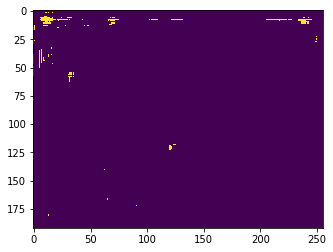

ground_truth segmentation 



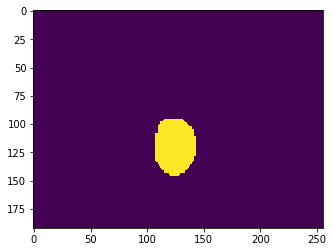

0.0955270033616286  step number is  0  batch_size is  16
Currently on step 100
the time is  53.24572 

Avg Jacc is:
predicted segmentation 



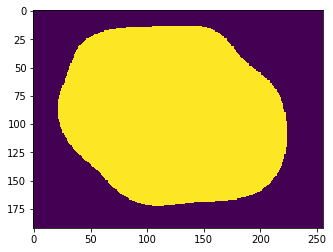

ground_truth segmentation 



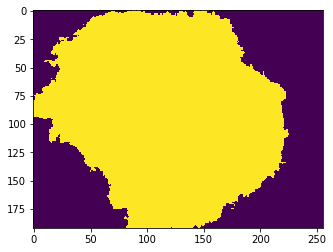

0.5998672485351563  step number is  100  batch_size is  16
Currently on step 200
the time is  100.83548300000001 

Avg Jacc is:
predicted segmentation 



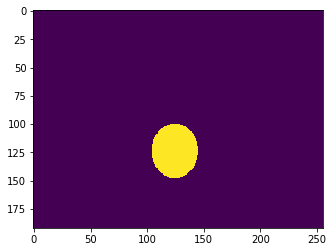

ground_truth segmentation 



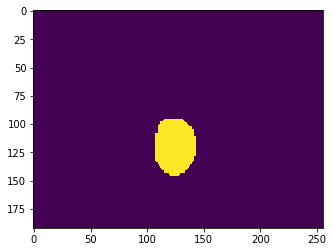

0.5958162747896635  step number is  200  batch_size is  16
Currently on step 300
the time is  148.526551 

Avg Jacc is:
predicted segmentation 



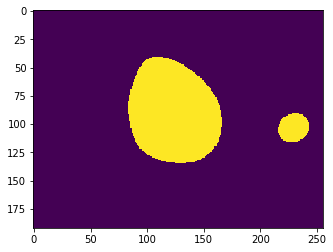

ground_truth segmentation 



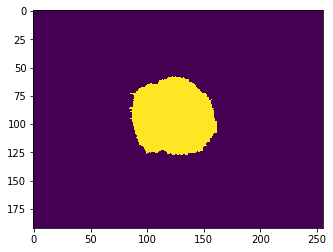

0.678541506253756  step number is  300  batch_size is  16
Currently on step 400
the time is  197.072091 

Avg Jacc is:
predicted segmentation 



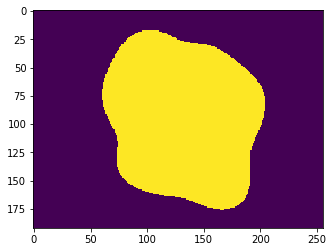

ground_truth segmentation 



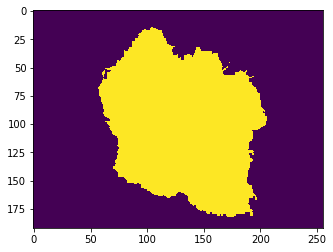

0.7034644493689903  step number is  400  batch_size is  16
Currently on step 500
the time is  246.15898199999998 

Avg Jacc is:
predicted segmentation 



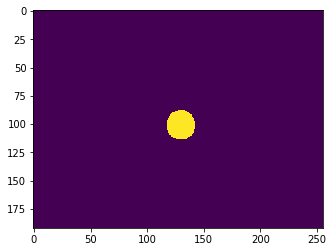

ground_truth segmentation 



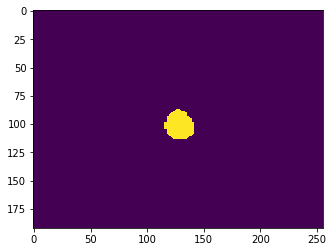

0.6885698758638822  step number is  500  batch_size is  16
Currently on step 600
the time is  294.936222 

Avg Jacc is:
predicted segmentation 



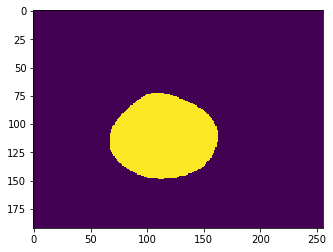

ground_truth segmentation 



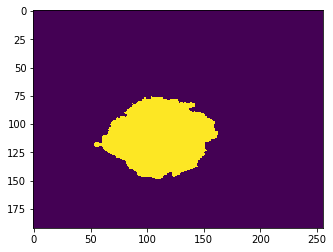

0.7331709641676682  step number is  600  batch_size is  16
Currently on step 700
the time is  343.366484 

Avg Jacc is:
predicted segmentation 



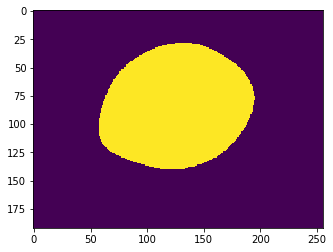

ground_truth segmentation 



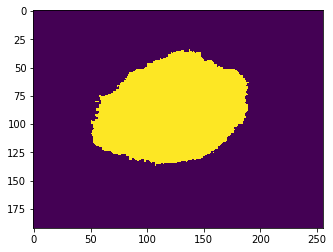

0.7103235684908353  step number is  700  batch_size is  16
Currently on step 800
the time is  391.76973200000003 

Avg Jacc is:
predicted segmentation 



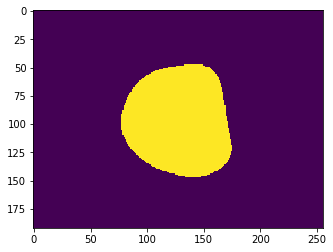

ground_truth segmentation 



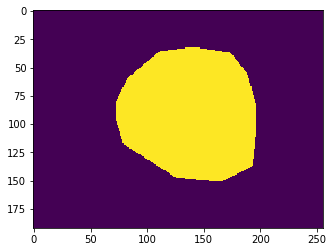

0.7049413240872897  step number is  800  batch_size is  16
Currently on step 900
the time is  440.700045 

Avg Jacc is:
predicted segmentation 



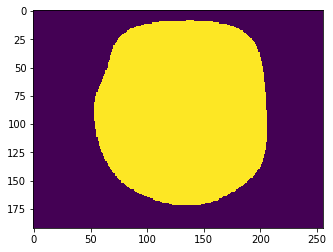

ground_truth segmentation 



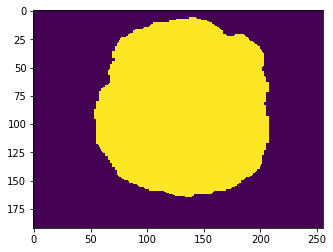

0.730311760535607  step number is  900  batch_size is  16
Currently on step 1000
the time is  489.397934 

Avg Jacc is:
predicted segmentation 



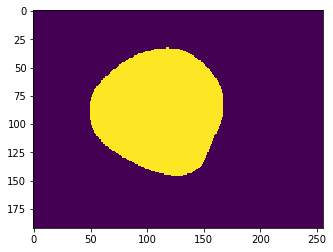

ground_truth segmentation 



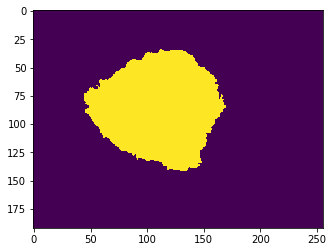

0.7326778118426983  step number is  1000  batch_size is  16
Currently on step 1100
the time is  538.334095 

Avg Jacc is:
predicted segmentation 



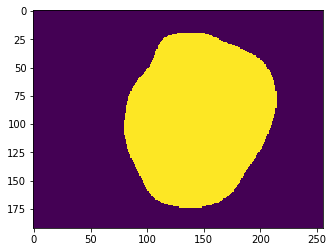

ground_truth segmentation 



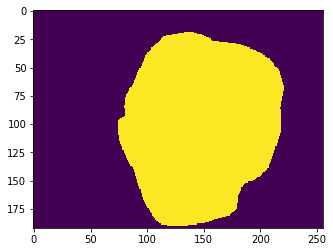

0.7354019165039063  step number is  1100  batch_size is  16
Currently on step 1200
the time is  587.613554 

Avg Jacc is:
predicted segmentation 



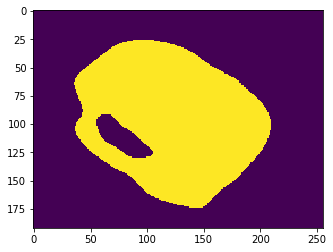

ground_truth segmentation 



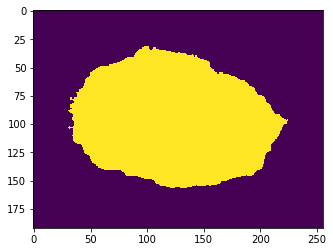

0.7363629854642428  step number is  1200  batch_size is  16
Currently on step 1300
the time is  636.751424 

Avg Jacc is:
predicted segmentation 



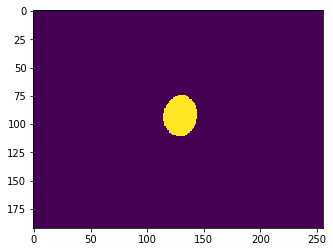

ground_truth segmentation 



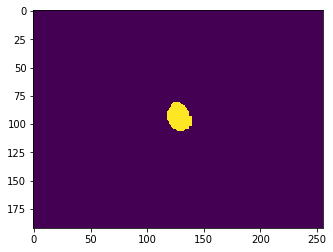

0.7373312143179086  step number is  1300  batch_size is  16
Currently on step 1400
the time is  687.19325 

Avg Jacc is:
predicted segmentation 



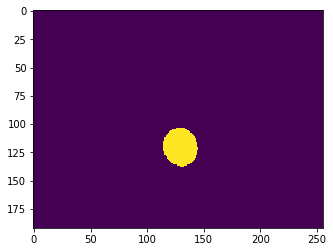

ground_truth segmentation 



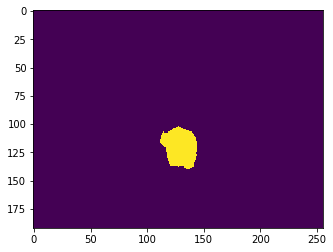

0.7464194077711839  step number is  1400  batch_size is  16
Currently on step 1500
the time is  737.642849 

Avg Jacc is:
predicted segmentation 



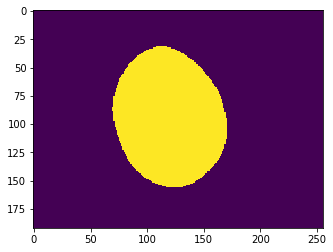

ground_truth segmentation 



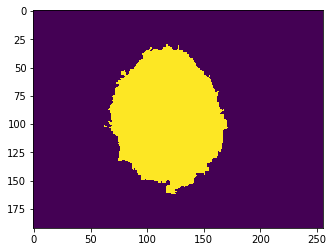

0.7284964341383714  step number is  1500  batch_size is  16
Currently on step 1600
the time is  787.669527 

Avg Jacc is:
predicted segmentation 



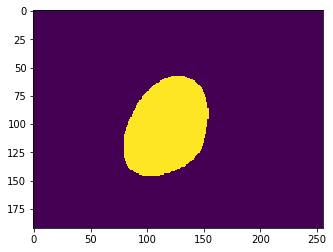

ground_truth segmentation 



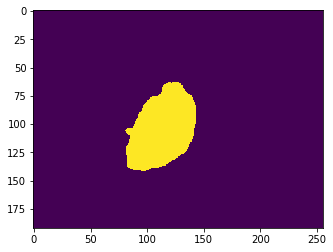

0.7154975891113281  step number is  1600  batch_size is  16
Currently on step 1700
the time is  838.3289570000001 

Avg Jacc is:
predicted segmentation 



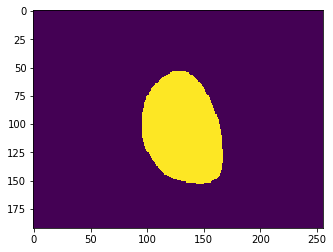

ground_truth segmentation 



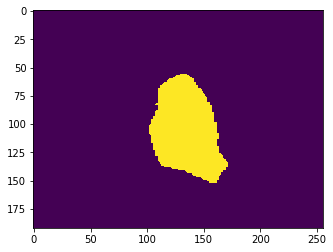

0.7537811279296875  step number is  1700  batch_size is  16
Currently on step 1800
the time is  889.044805 

Avg Jacc is:
predicted segmentation 



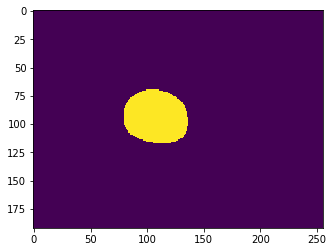

ground_truth segmentation 



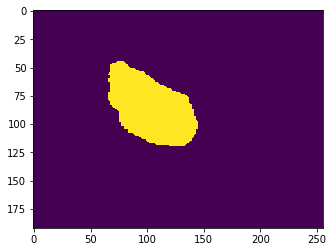

0.7639185391939604  step number is  1800  batch_size is  16
Currently on step 1900
the time is  939.9653950000001 

Avg Jacc is:
predicted segmentation 



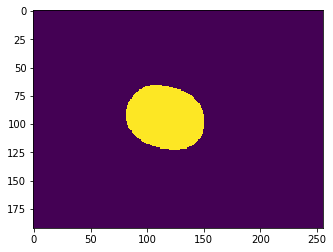

ground_truth segmentation 



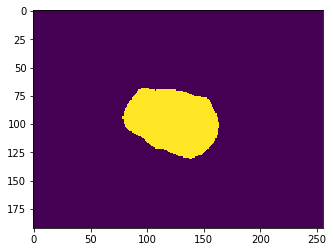

0.736285400390625  step number is  1900  batch_size is  16
Currently on step 2000
the time is  990.536464 

Avg Jacc is:
predicted segmentation 



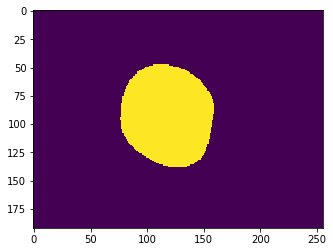

ground_truth segmentation 



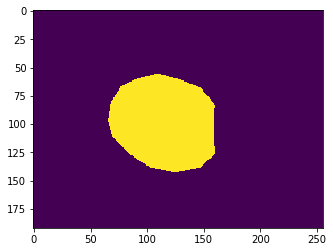

0.7411261925330529  step number is  2000  batch_size is  16
Currently on step 2100
the time is  1041.256187 

Avg Jacc is:
predicted segmentation 



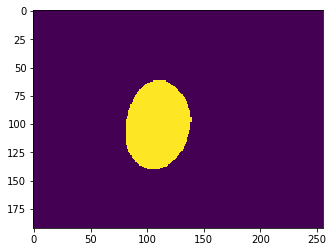

ground_truth segmentation 



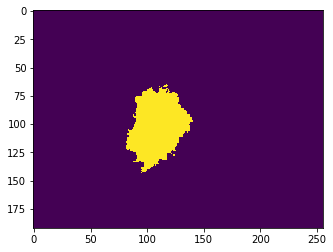

0.7585964496319111  step number is  2100  batch_size is  16
Currently on step 2200
the time is  1092.569577 

Avg Jacc is:
predicted segmentation 



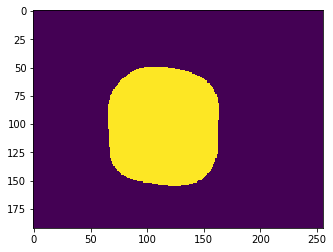

ground_truth segmentation 



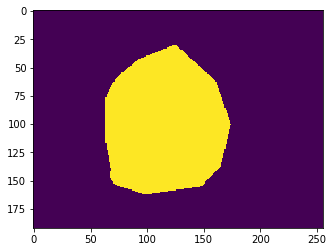

0.7510825523963341  step number is  2200  batch_size is  16
Currently on step 2300
the time is  1144.112546 

Avg Jacc is:
predicted segmentation 



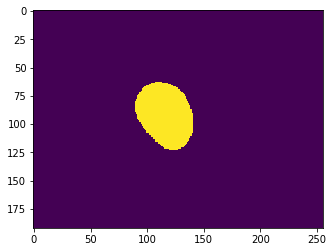

ground_truth segmentation 



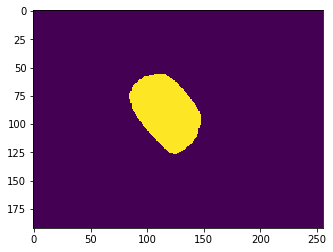

0.7490386376014122  step number is  2300  batch_size is  16
Currently on step 2400
the time is  1195.901575 

Avg Jacc is:
predicted segmentation 



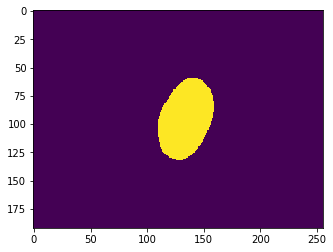

ground_truth segmentation 



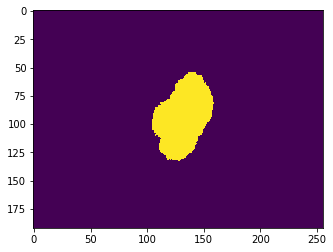

0.7533297612116887  step number is  2400  batch_size is  16
Currently on step 2500
the time is  1247.80454 

Avg Jacc is:
predicted segmentation 



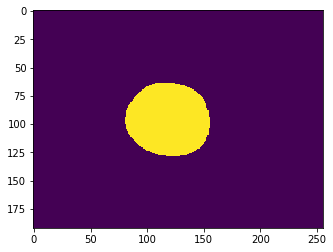

ground_truth segmentation 



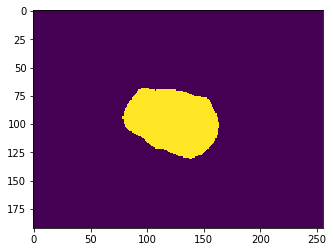

0.7539175767164964  step number is  2500  batch_size is  16
Currently on step 2600
the time is  1299.57406 

Avg Jacc is:
predicted segmentation 



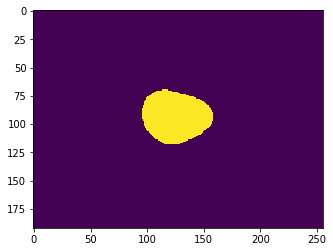

ground_truth segmentation 



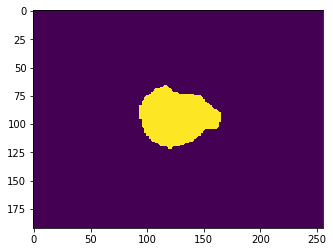

0.7484209500826322  step number is  2600  batch_size is  16
Currently on step 2700
the time is  1351.121248 

Avg Jacc is:
predicted segmentation 



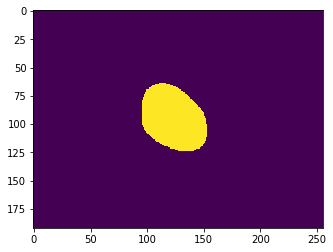

ground_truth segmentation 



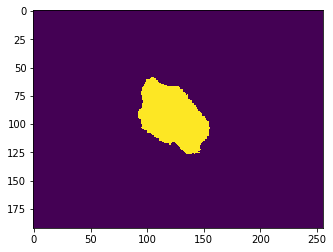

0.7556478060208834  step number is  2700  batch_size is  16
Currently on step 2800
the time is  1403.082226 

Avg Jacc is:
predicted segmentation 



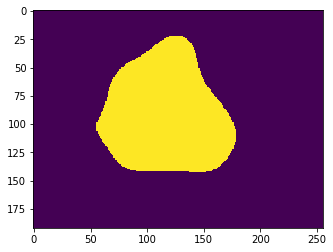

ground_truth segmentation 



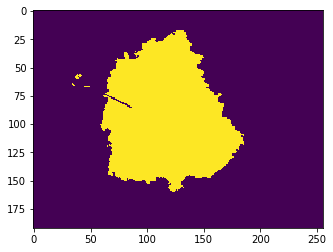

0.7371951763446515  step number is  2800  batch_size is  16
Currently on step 2900
the time is  1456.245659 

Avg Jacc is:
predicted segmentation 



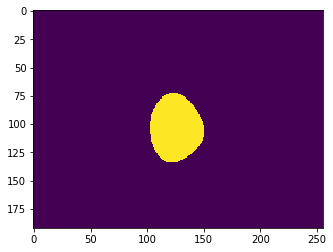

ground_truth segmentation 



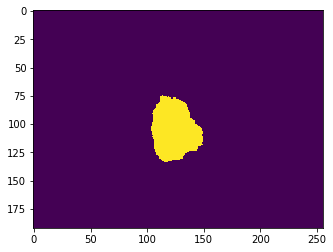

0.7594282883864183  step number is  2900  batch_size is  16
Currently on step 3000
the time is  1509.630017 

Avg Jacc is:
predicted segmentation 



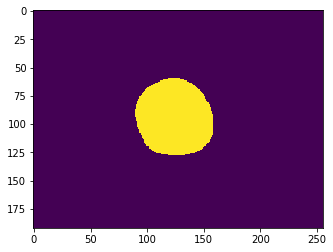

ground_truth segmentation 



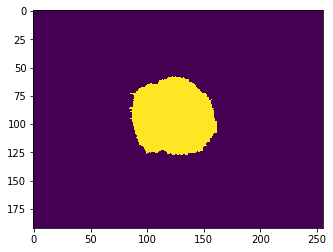

0.7299276498647836  step number is  3000  batch_size is  16
Currently on step 3100
the time is  1562.839145 

Avg Jacc is:
predicted segmentation 



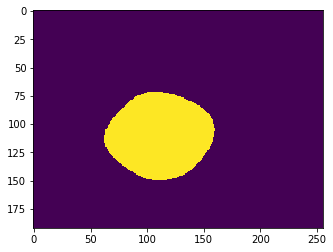

ground_truth segmentation 



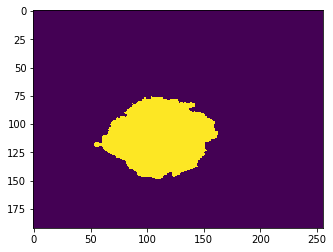

0.7626564025878906  step number is  3100  batch_size is  16
Currently on step 3200
the time is  1616.516689 

Avg Jacc is:
predicted segmentation 



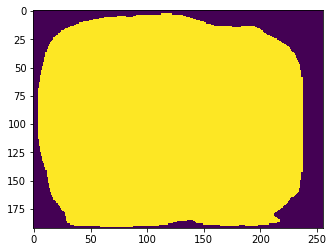

ground_truth segmentation 



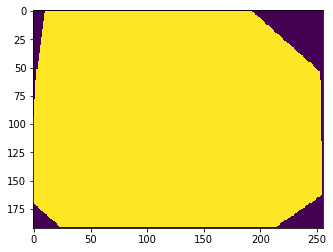

0.7596230140099158  step number is  3200  batch_size is  16
Currently on step 3300
the time is  1669.023919 

Avg Jacc is:
predicted segmentation 



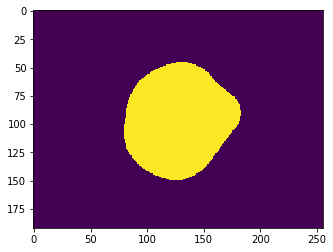

ground_truth segmentation 



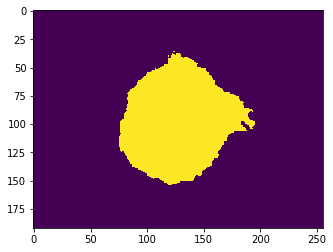

0.7647007868840144  step number is  3300  batch_size is  16
Currently on step 3400
the time is  1723.406793 

Avg Jacc is:
predicted segmentation 



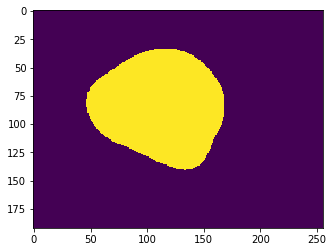

ground_truth segmentation 



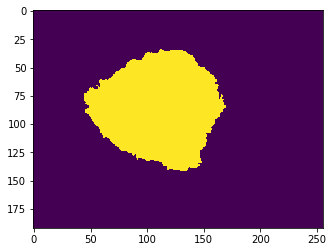

0.7706657409667969  step number is  3400  batch_size is  16
Currently on step 3500
the time is  1776.883958 

Avg Jacc is:
predicted segmentation 



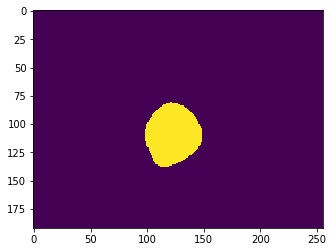

ground_truth segmentation 



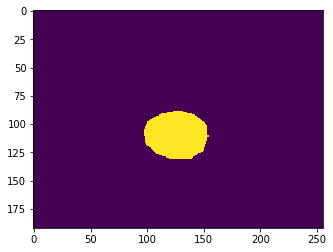

0.7408287635216346  step number is  3500  batch_size is  16
Currently on step 3600
the time is  1830.3518550000001 

Avg Jacc is:
predicted segmentation 



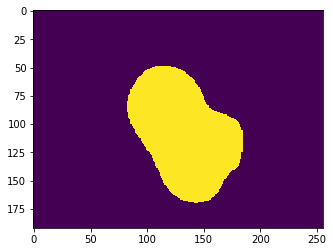

ground_truth segmentation 



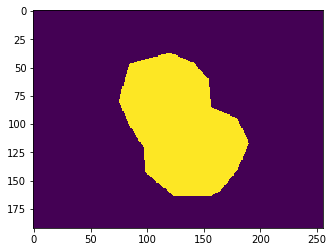

0.7661495502178486  step number is  3600  batch_size is  16
Currently on step 3700
the time is  1883.83706 

Avg Jacc is:
predicted segmentation 



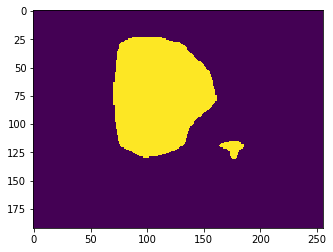

ground_truth segmentation 



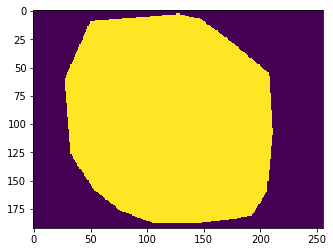

0.7582452627328726  step number is  3700  batch_size is  16
Currently on step 3800
the time is  1937.616045 

Avg Jacc is:
predicted segmentation 



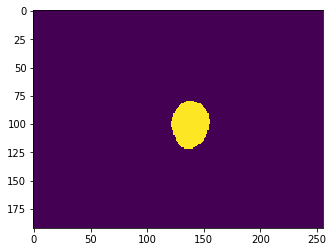

ground_truth segmentation 



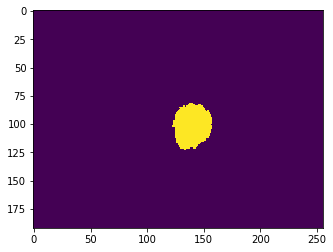

0.7573909466083233  step number is  3800  batch_size is  16
Currently on step 3900
the time is  1991.587302 

Avg Jacc is:
predicted segmentation 



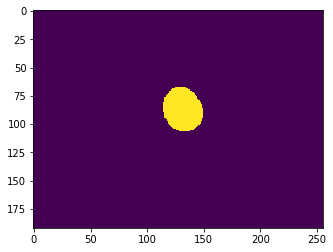

ground_truth segmentation 



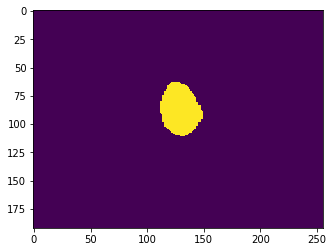

0.7718002319335937  step number is  3900  batch_size is  16
Currently on step 4000
the time is  2044.475653 

Avg Jacc is:
predicted segmentation 



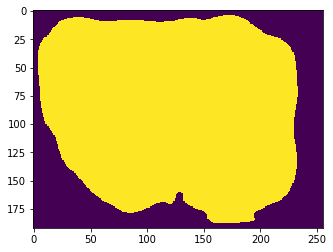

ground_truth segmentation 



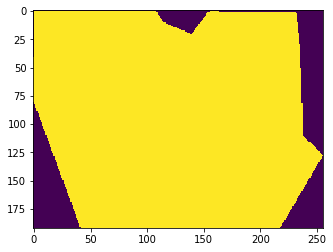

0.7661412165715145  step number is  4000  batch_size is  16
Currently on step 4100
the time is  2097.646239 

Avg Jacc is:
predicted segmentation 



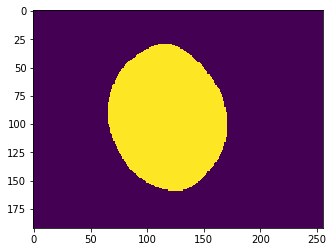

ground_truth segmentation 



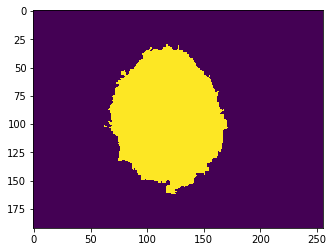

0.7695897028996395  step number is  4100  batch_size is  16
Currently on step 4200
the time is  2150.409395 

Avg Jacc is:
predicted segmentation 



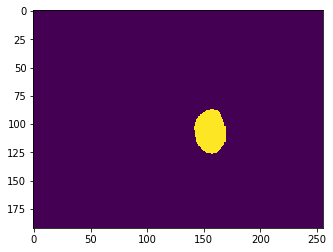

ground_truth segmentation 



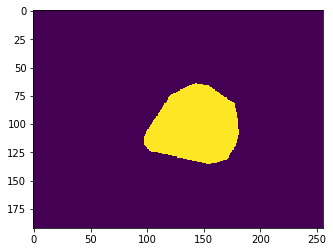

0.7688350970928486  step number is  4200  batch_size is  16
Currently on step 4300
the time is  2202.868945 

Avg Jacc is:
predicted segmentation 



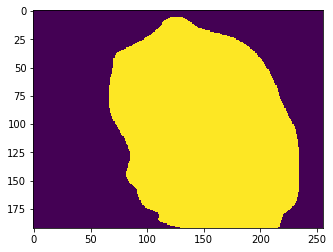

ground_truth segmentation 



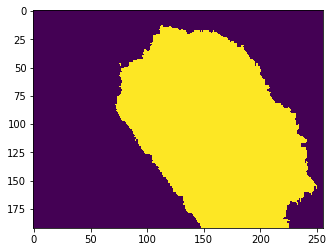

0.7466180067795973  step number is  4300  batch_size is  16
Currently on step 4400
the time is  2256.319529 

Avg Jacc is:
predicted segmentation 



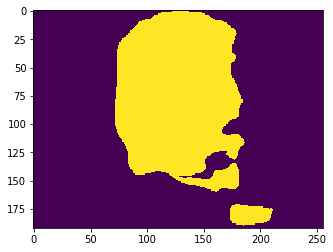

ground_truth segmentation 



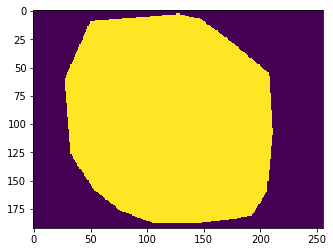

0.7449620173527645  step number is  4400  batch_size is  16
Currently on step 4500
the time is  2310.9938740000002 

Avg Jacc is:
predicted segmentation 



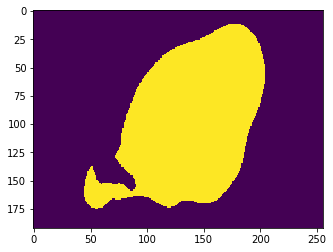

ground_truth segmentation 



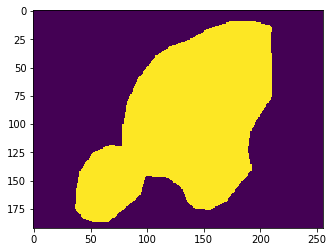

0.7749276968149038  step number is  4500  batch_size is  16
Currently on step 4600
the time is  2366.175765 

Avg Jacc is:
predicted segmentation 



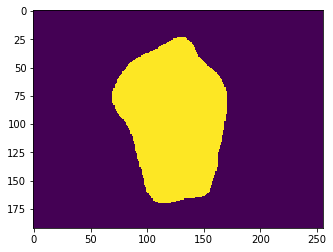

ground_truth segmentation 



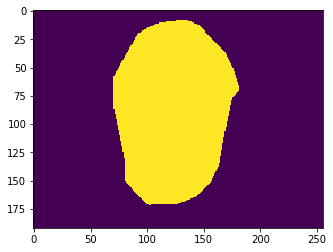

0.7497837360088642  step number is  4600  batch_size is  16
Currently on step 4700
the time is  2419.924772 

Avg Jacc is:
predicted segmentation 



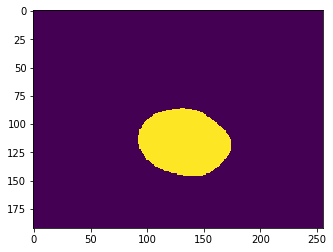

ground_truth segmentation 



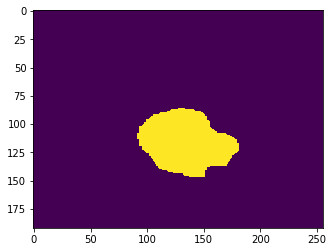

0.7377643291766827  step number is  4700  batch_size is  16
Currently on step 4800
the time is  2474.352029 

Avg Jacc is:
predicted segmentation 



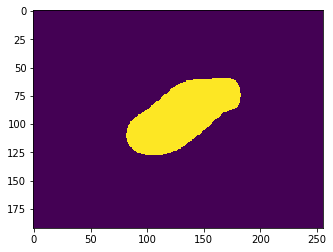

ground_truth segmentation 



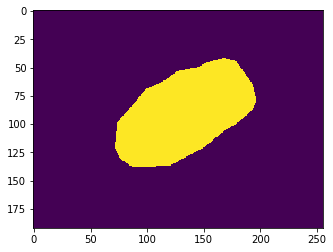

0.7564296428973858  step number is  4800  batch_size is  16
Currently on step 4900
the time is  2528.83866 

Avg Jacc is:
predicted segmentation 



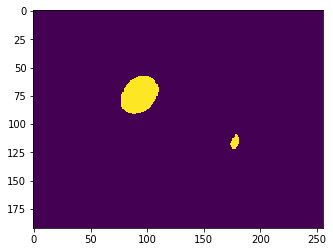

ground_truth segmentation 



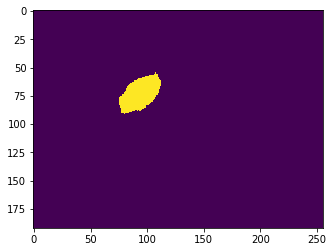

0.7486034099872295  step number is  4900  batch_size is  16
Currently on step 5000
the time is  2583.2465310000002 

Avg Jacc is:
predicted segmentation 



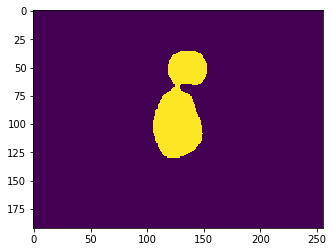

ground_truth segmentation 



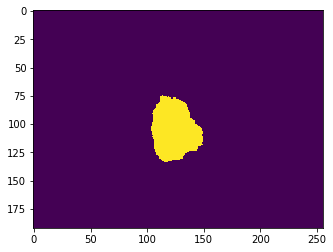

0.735931631234976  step number is  5000  batch_size is  16
Currently on step 5100
the time is  2638.442574 

Avg Jacc is:
predicted segmentation 



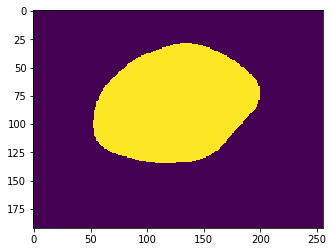

ground_truth segmentation 



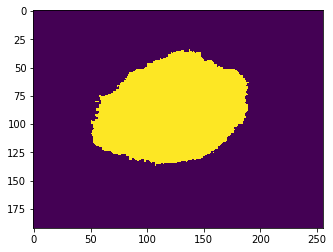

0.7646045391376202  step number is  5100  batch_size is  16
Currently on step 5200
the time is  2693.748477 

Avg Jacc is:
predicted segmentation 



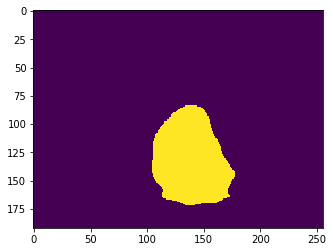

ground_truth segmentation 



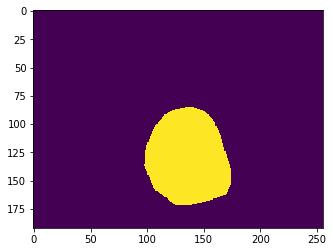

0.7470282921424278  step number is  5200  batch_size is  16
Currently on step 5300
the time is  2749.045536 

Avg Jacc is:
predicted segmentation 



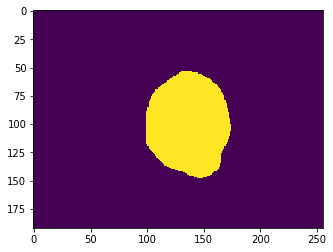

ground_truth segmentation 



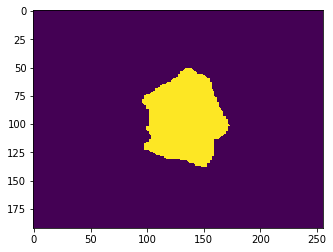

0.7450114323542668  step number is  5300  batch_size is  16
Currently on step 5400
the time is  2803.746591 

Avg Jacc is:
predicted segmentation 



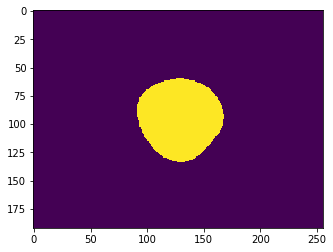

ground_truth segmentation 



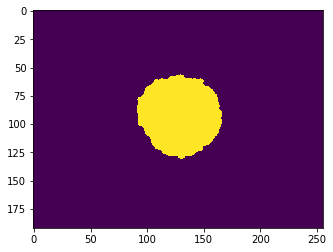

0.7642234215369591  step number is  5400  batch_size is  16
Currently on step 5500
the time is  2858.631597 

Avg Jacc is:
predicted segmentation 



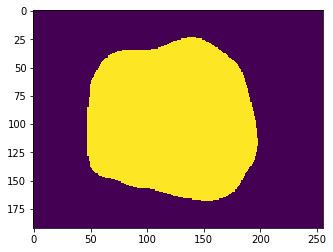

ground_truth segmentation 



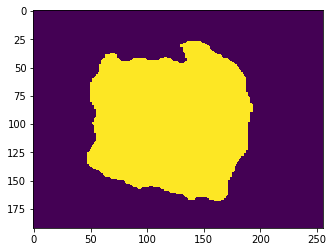

0.7609409038837139  step number is  5500  batch_size is  16
Currently on step 5600
the time is  2914.115925 

Avg Jacc is:
predicted segmentation 



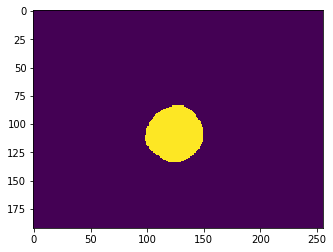

ground_truth segmentation 



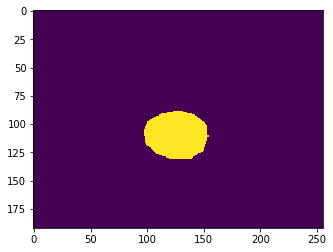

0.7793490483210637  step number is  5600  batch_size is  16
Currently on step 5700
the time is  2969.169738 

Avg Jacc is:
predicted segmentation 



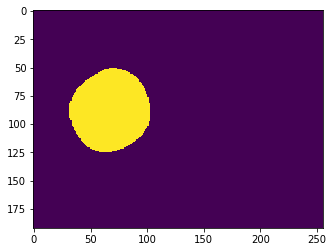

ground_truth segmentation 



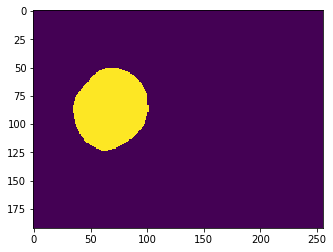

0.7453628540039062  step number is  5700  batch_size is  16
Currently on step 5800
the time is  3024.666302 

Avg Jacc is:
predicted segmentation 



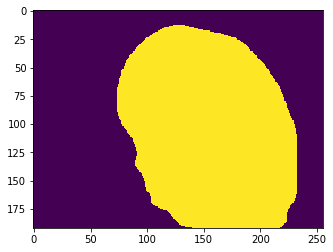

ground_truth segmentation 



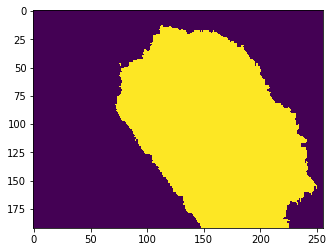

0.7591071495643029  step number is  5800  batch_size is  16
Currently on step 5900
the time is  3080.545247 

Avg Jacc is:
predicted segmentation 



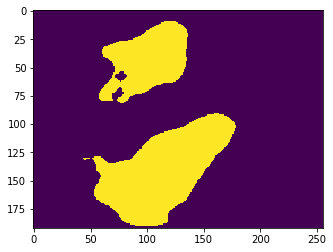

ground_truth segmentation 



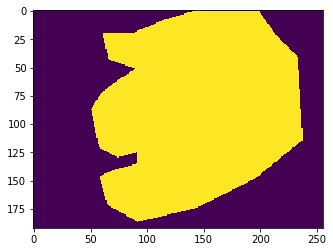

0.7666784433218149  step number is  5900  batch_size is  16
Currently on step 6000
the time is  3137.263196 

Avg Jacc is:
predicted segmentation 



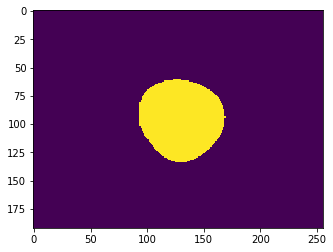

ground_truth segmentation 



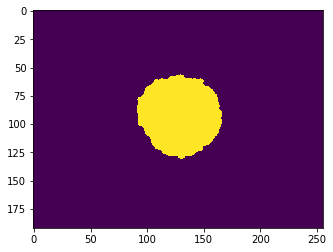

0.7647774916428786  step number is  6000  batch_size is  16
Currently on step 6100
the time is  3193.029075 

Avg Jacc is:
predicted segmentation 



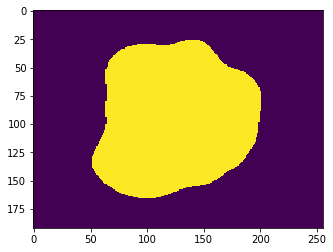

ground_truth segmentation 



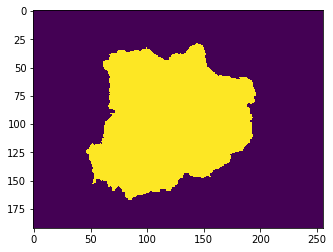

0.7651863685021034  step number is  6100  batch_size is  16
Currently on step 6200
the time is  3248.385766 

Avg Jacc is:
predicted segmentation 



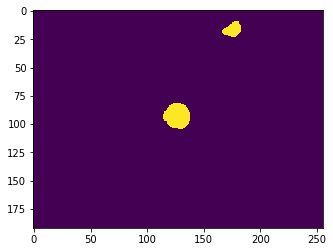

ground_truth segmentation 



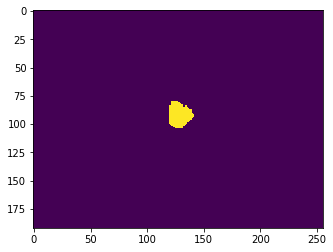

0.7769328190730168  step number is  6200  batch_size is  16
Currently on step 6300
the time is  3304.256326 

Avg Jacc is:
predicted segmentation 



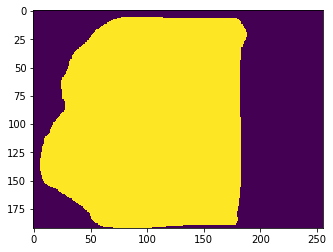

ground_truth segmentation 



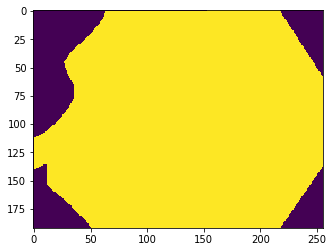

0.765469477726863  step number is  6300  batch_size is  16
Currently on step 6400
the time is  3360.327405 

Avg Jacc is:
predicted segmentation 



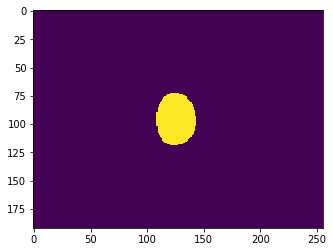

ground_truth segmentation 



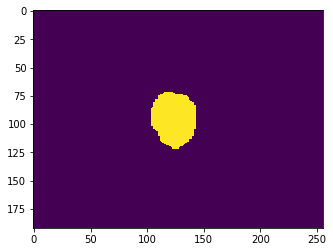

0.7744799687312199  step number is  6400  batch_size is  16
Currently on step 6500
the time is  3417.00221 

Avg Jacc is:
predicted segmentation 



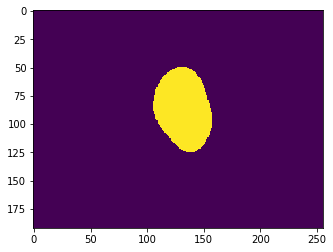

ground_truth segmentation 



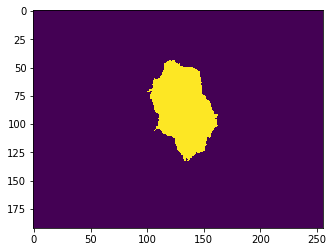

0.7634480989896334  step number is  6500  batch_size is  16
Currently on step 6600
the time is  3474.517764 

Avg Jacc is:
predicted segmentation 



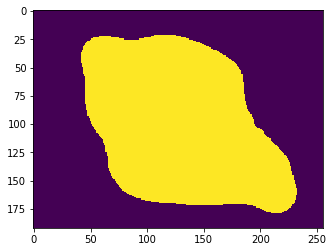

ground_truth segmentation 



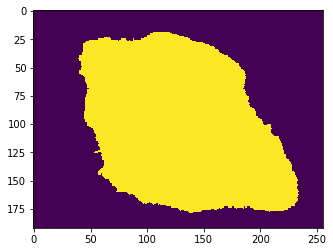

0.7339292672964243  step number is  6600  batch_size is  16
Currently on step 6700
the time is  3531.579269 

Avg Jacc is:
predicted segmentation 



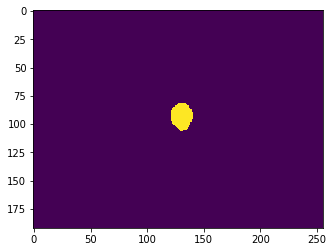

ground_truth segmentation 



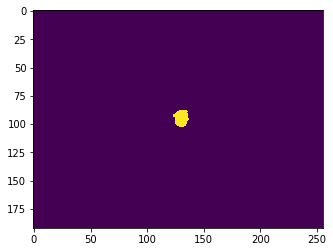

0.7406866220327524  step number is  6700  batch_size is  16
Currently on step 6800
the time is  3587.833299 

Avg Jacc is:
predicted segmentation 



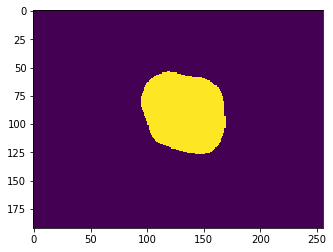

ground_truth segmentation 



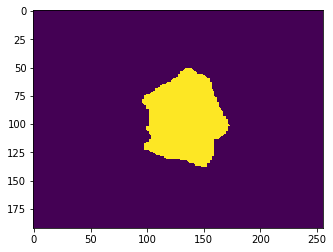

0.7685867309570312  step number is  6800  batch_size is  16
Currently on step 6900
the time is  3643.766676 

Avg Jacc is:
predicted segmentation 



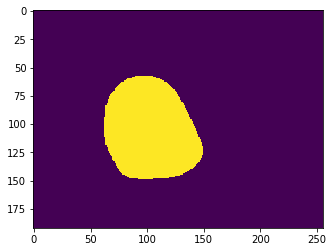

ground_truth segmentation 



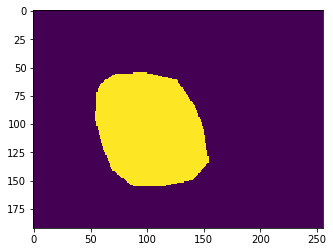

0.7627308772160457  step number is  6900  batch_size is  16
Currently on step 7000
the time is  3699.81457 

Avg Jacc is:
predicted segmentation 



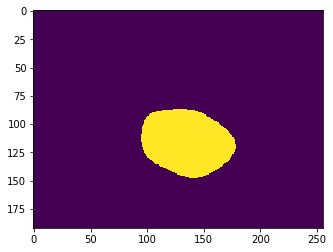

ground_truth segmentation 



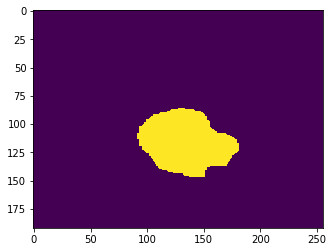

0.7552323561448318  step number is  7000  batch_size is  16
Currently on step 7100
the time is  3755.849741 

Avg Jacc is:
predicted segmentation 



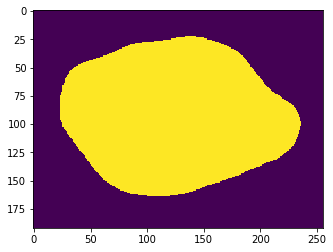

ground_truth segmentation 



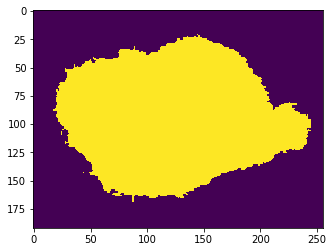

0.7602032588078426  step number is  7100  batch_size is  16
Currently on step 7200
the time is  3812.031927 

Avg Jacc is:
predicted segmentation 



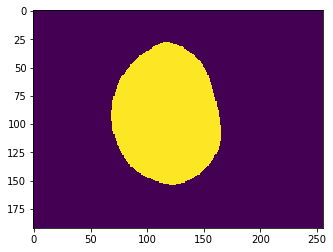

ground_truth segmentation 



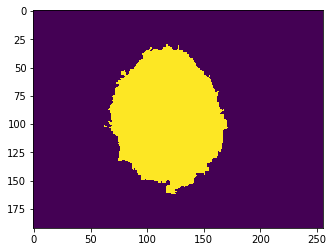

0.7435505793644832  step number is  7200  batch_size is  16
Currently on step 7300
the time is  3868.921608 

Avg Jacc is:
predicted segmentation 



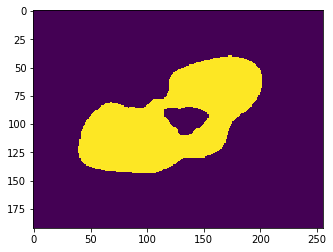

ground_truth segmentation 



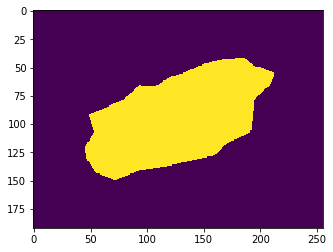

0.76207275390625  step number is  7300  batch_size is  16
Currently on step 7400
the time is  3925.490246 

Avg Jacc is:
predicted segmentation 



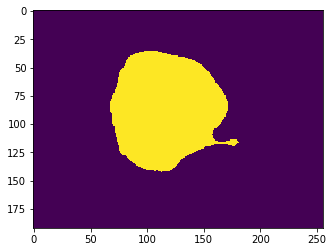

ground_truth segmentation 



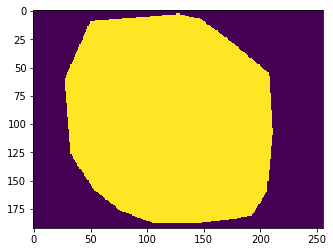

0.759152573805589  step number is  7400  batch_size is  16
Currently on step 7500
the time is  3981.99682 

Avg Jacc is:
predicted segmentation 



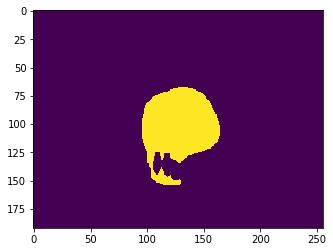

ground_truth segmentation 



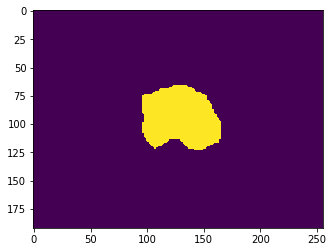

0.7389092078575721  step number is  7500  batch_size is  16
Currently on step 7600
the time is  4038.984459 

Avg Jacc is:
predicted segmentation 



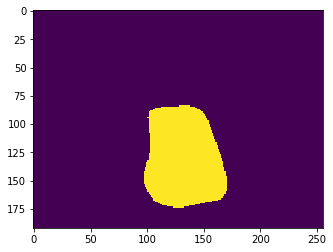

ground_truth segmentation 



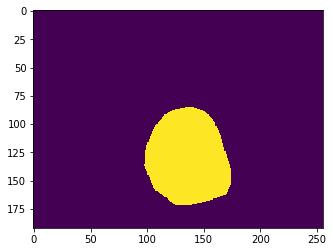

0.7761286808894231  step number is  7600  batch_size is  16
Currently on step 7700
the time is  4096.336284 

Avg Jacc is:
predicted segmentation 



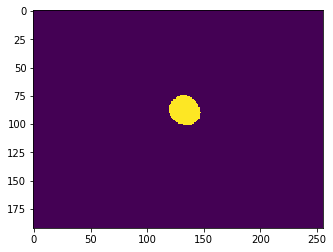

ground_truth segmentation 



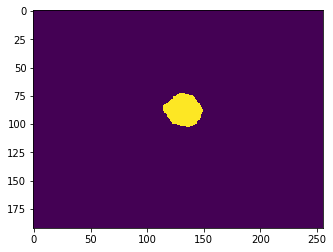

0.758523207444411  step number is  7700  batch_size is  16
Currently on step 7800
the time is  4154.082897 

Avg Jacc is:
predicted segmentation 



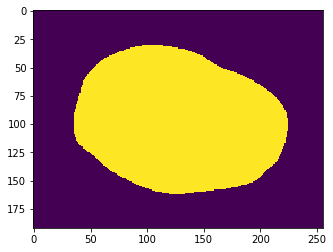

ground_truth segmentation 



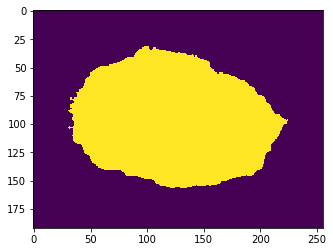

0.7698643024151142  step number is  7800  batch_size is  16
Currently on step 7900
the time is  4211.989917 

Avg Jacc is:
predicted segmentation 



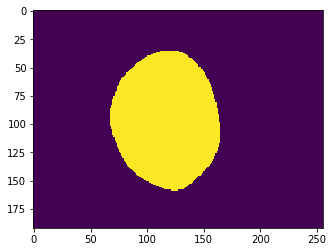

ground_truth segmentation 



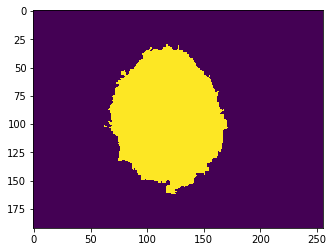

0.7537155151367188  step number is  7900  batch_size is  16
Currently on step 8000
the time is  4270.614712 

Avg Jacc is:
predicted segmentation 



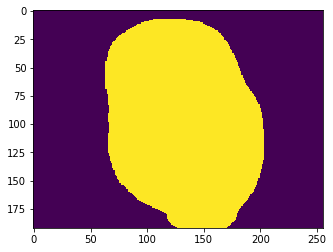

ground_truth segmentation 



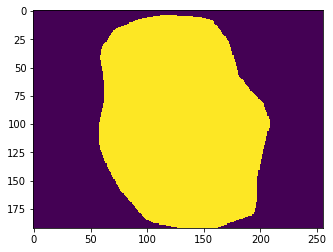

0.7757677518404447  step number is  8000  batch_size is  16
Currently on step 8100
the time is  4329.556517 

Avg Jacc is:
predicted segmentation 



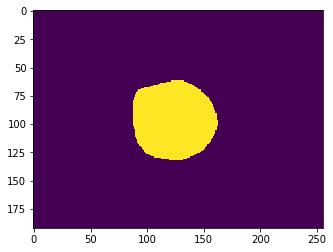

ground_truth segmentation 



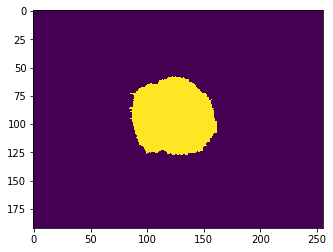

0.7790927593524639  step number is  8100  batch_size is  16
Currently on step 8200
the time is  4388.068092 

Avg Jacc is:
predicted segmentation 



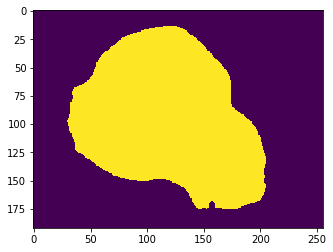

ground_truth segmentation 



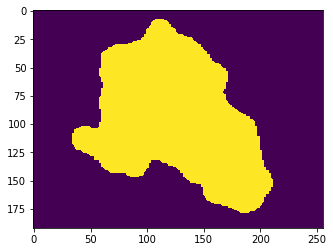

0.7373228219839243  step number is  8200  batch_size is  16
Currently on step 8300
the time is  4446.262627 

Avg Jacc is:
predicted segmentation 



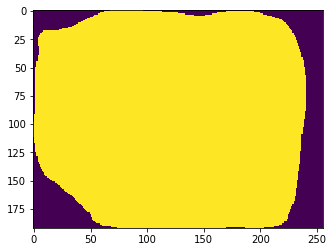

ground_truth segmentation 



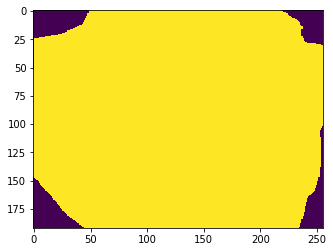

0.7502021202674278  step number is  8300  batch_size is  16
Currently on step 8400
the time is  4504.87798 

Avg Jacc is:
predicted segmentation 



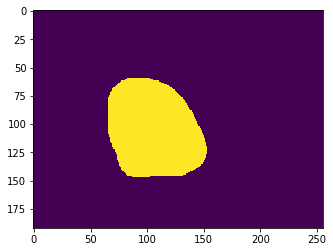

ground_truth segmentation 



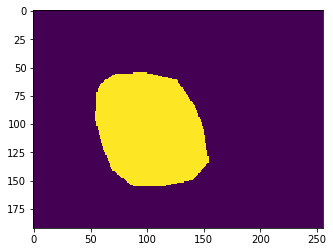

0.7676721426156851  step number is  8400  batch_size is  16
Currently on step 8500
the time is  4563.455711 

Avg Jacc is:
predicted segmentation 



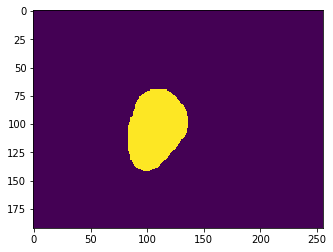

ground_truth segmentation 



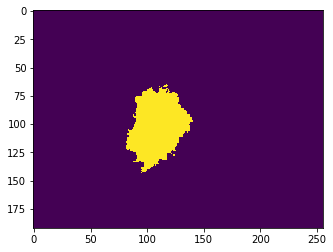

0.7595882709209736  step number is  8500  batch_size is  16
Currently on step 8600
the time is  4621.901756 

Avg Jacc is:
predicted segmentation 



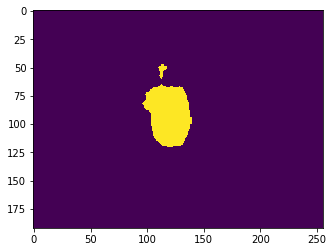

ground_truth segmentation 



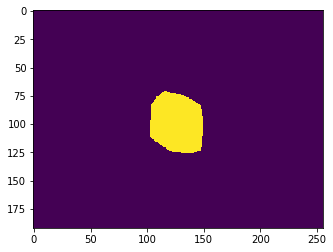

0.7619691702035757  step number is  8600  batch_size is  16
Currently on step 8700
the time is  4680.216874 

Avg Jacc is:
predicted segmentation 



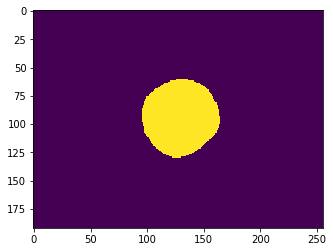

ground_truth segmentation 



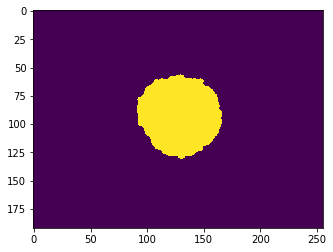

0.7366403432992789  step number is  8700  batch_size is  16
Currently on step 8800
the time is  4738.621638 

Avg Jacc is:
predicted segmentation 



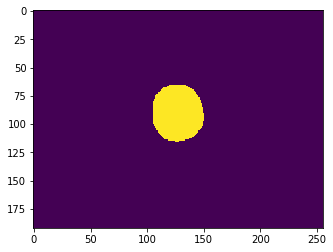

ground_truth segmentation 



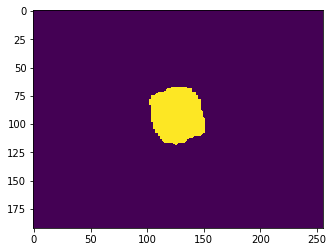

0.759406984769381  step number is  8800  batch_size is  16
Currently on step 8900
the time is  4797.293038 

Avg Jacc is:
predicted segmentation 



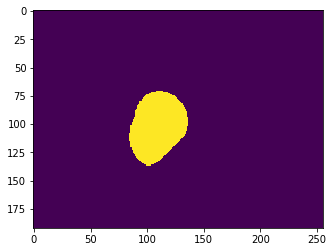

ground_truth segmentation 



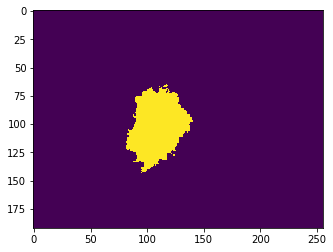

0.7467481173001803  step number is  8900  batch_size is  16
Currently on step 9000
the time is  4855.818768 

Avg Jacc is:
predicted segmentation 



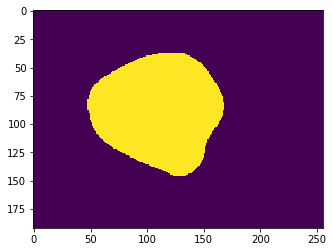

ground_truth segmentation 



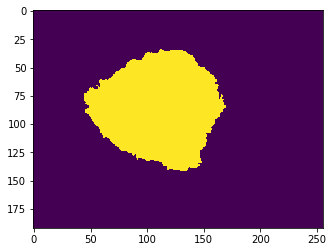

0.7680423443134015  step number is  9000  batch_size is  16
Currently on step 9100
the time is  4914.431181 

Avg Jacc is:
predicted segmentation 



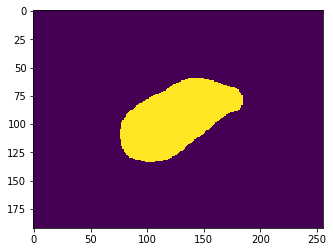

ground_truth segmentation 



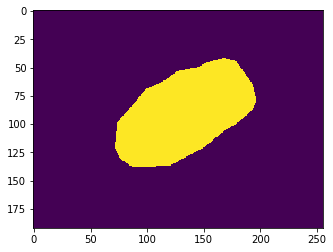

0.7576258732722356  step number is  9100  batch_size is  16
Currently on step 9200
the time is  4972.879234 

Avg Jacc is:
predicted segmentation 



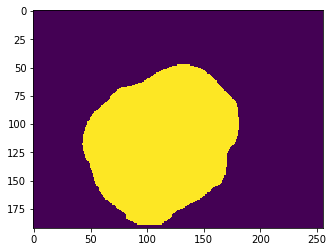

ground_truth segmentation 



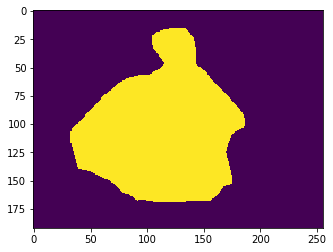

0.766958500788762  step number is  9200  batch_size is  16
Currently on step 9300
the time is  5031.583196 

Avg Jacc is:
predicted segmentation 



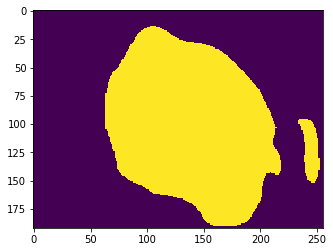

ground_truth segmentation 



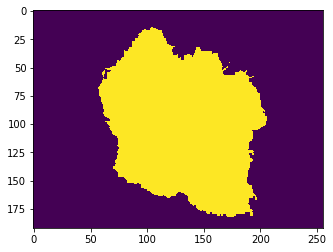

0.7542256868802584  step number is  9300  batch_size is  16
Currently on step 9400
the time is  5089.606807 

Avg Jacc is:
predicted segmentation 



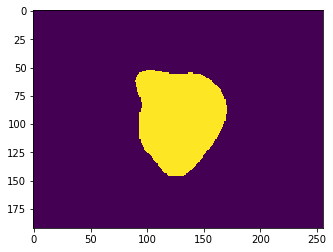

ground_truth segmentation 



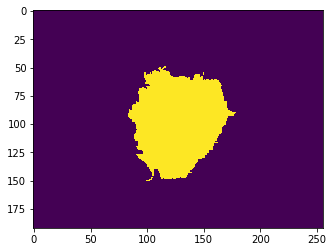

0.7670580350435697  step number is  9400  batch_size is  16
Currently on step 9500
the time is  5147.951588 

Avg Jacc is:
predicted segmentation 



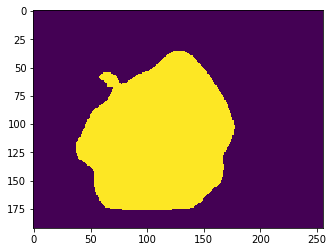

ground_truth segmentation 



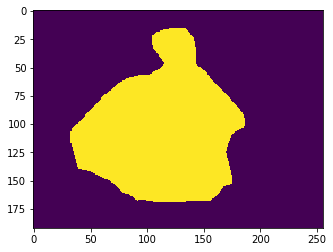

0.7695104745718149  step number is  9500  batch_size is  16
Currently on step 9600
the time is  5206.571915 

Avg Jacc is:
predicted segmentation 



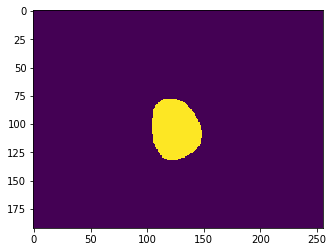

ground_truth segmentation 



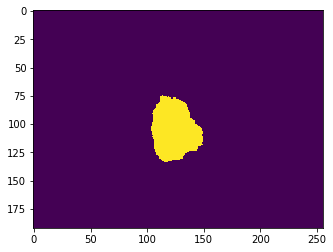

0.7641552264873798  step number is  9600  batch_size is  16
Currently on step 9700
the time is  5265.577545 

Avg Jacc is:
predicted segmentation 



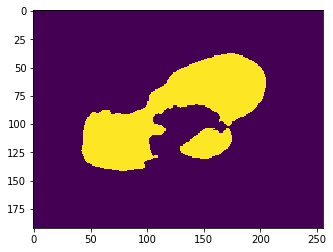

ground_truth segmentation 



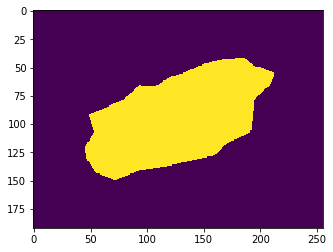

0.773389141376202  step number is  9700  batch_size is  16
Currently on step 9800
the time is  5324.191429 

Avg Jacc is:
predicted segmentation 



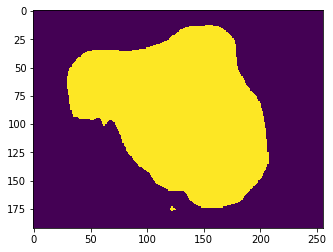

ground_truth segmentation 



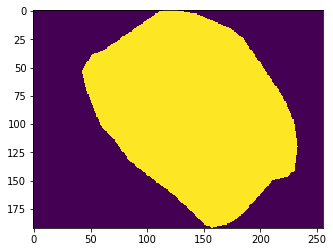

0.7834801307091346  step number is  9800  batch_size is  16
Currently on step 9900
the time is  5382.672893 

Avg Jacc is:
predicted segmentation 



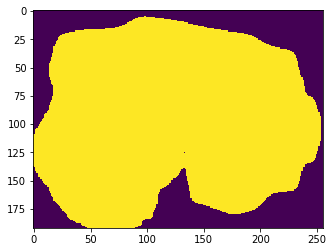

ground_truth segmentation 



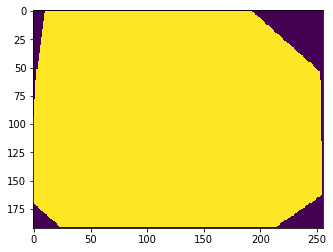

0.7547349196213943  step number is  9900  batch_size is  16
Currently on step 10000
the time is  5441.479574 

Avg Jacc is:
predicted segmentation 



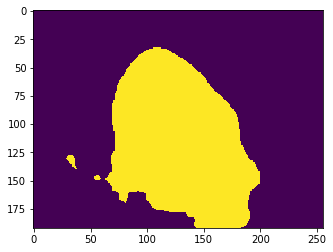

ground_truth segmentation 



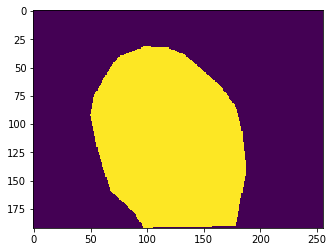

0.7545048640324519  step number is  10000  batch_size is  16
Currently on step 10100
the time is  5500.663959 

Avg Jacc is:
predicted segmentation 



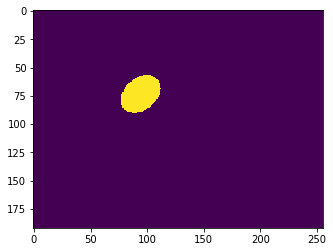

ground_truth segmentation 



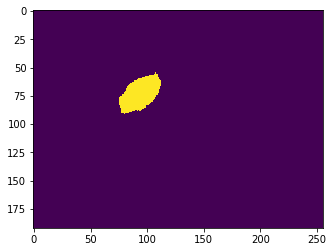

0.7761330237755408  step number is  10100  batch_size is  16
Currently on step 10200
the time is  5560.077247 

Avg Jacc is:
predicted segmentation 



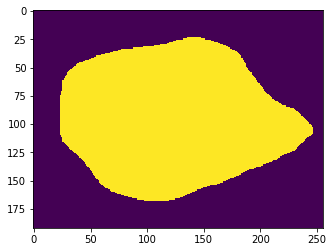

ground_truth segmentation 



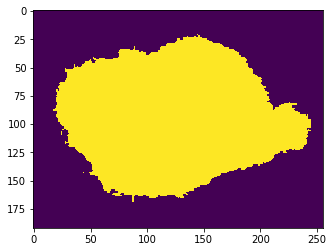

0.7671487074631911  step number is  10200  batch_size is  16
Currently on step 10300
the time is  5620.204978 

Avg Jacc is:
predicted segmentation 



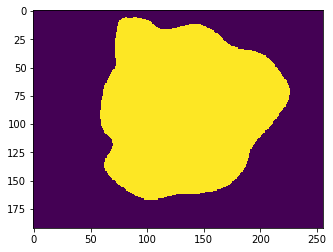

ground_truth segmentation 



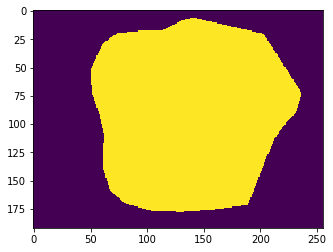

0.7547696040226863  step number is  10300  batch_size is  16
Currently on step 10400
the time is  5679.918924 

Avg Jacc is:
predicted segmentation 



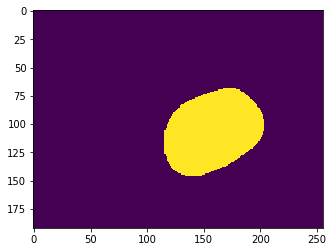

ground_truth segmentation 



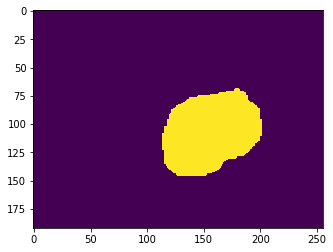

0.7505395155686598  step number is  10400  batch_size is  16


In [61]:
steps = 10500
import time
batch_size = 16
j_test = []
j_train = []

#use Cifar_helper to set up next batch
with tf.Session() as sess:
    print("starting init")
    sess.run(init)
    print("done init")
    
    start_time = time.clock()
    
    for i in range(steps): 
        batch_x, batch_y = mel.next_batch(batch_size)
        
        sess.run(train,feed_dict={x:batch_x,y_true:batch_y,hold_prob:0.5,hold_prob2:0.5, tr:0})
        
        
        if i%100 == 0:
            print('Currently on step {}'.format(i))
            print("the time is ", time.clock() - start_time, "\n")
             
            
            pred_o = tf.math.round(pred)
            true_o = tf.math.round(true)

            #compute the jacc

            intersect_o = tf.reduce_sum(tf.cast(true*pred_o, tf.float32), axis = [1,2])
            union_o = tf.reduce_sum(tf.cast(pred_o, tf.float32), axis = [1,2]) + tf.reduce_sum(tf.cast(true, tf.float32), axis = [1,2]) - intersect_o  
            jacc_o = intersect_o/union_o
            pct_o = intersect_o/ tf.reduce_sum(tf.cast(pred_o, tf.float32), axis = [1,2])
            pct_n = intersect_o/tf.reduce_sum(tf.cast(true, tf.float32), axis = [1,2]) 
            
            J_out_t = sess.run([jacc_o],feed_dict={x:batch_x,y_true:batch_y,hold_prob:1.0,hold_prob2:1.0,tr: 1.0})
            J_train = np.sum(J_out_t[0])/J_out_t[0].shape[0]
            j_train += [J_train]
            
            
            print('Avg Jacc is:')
            J_out = sess.run([jacc_o, pred_o, true_o, pct_o, pct_n],feed_dict={x:mel.test_images,y_true:mel.test_labels,hold_prob:1.0, hold_prob2:1.0, tr:1.0})
            
           
            rn = int(np.random.random()*J_out[1].shape[0])
            print("predicted segmentation \n")
            plt.imshow(J_out[1][rn, :, :])
            plt.show()
            print("ground_truth segmentation \n")
            plt.imshow(J_out[2][rn, :, :])
            plt.show()
            ##it cannot evaluate over the test set, the test set is too large...reduce size of test set (now 5%)
            
            J_test = np.sum(J_out[0])/J_out[0].shape[0]
            j_test += [J_test]
            #print(J_out[4], "\n J_out 4")

            print(J_test, " step number is ",  i, " batch_size is ", batch_size)
          
           
        if i == steps - 1:
            pred_mel = sess.run([pred],feed_dict={x:mel.test_images,y_true:mel.test_labels,hold_prob:1.0, hold_prob2:1.0, tr:1.0})
            pred_pigment = sess.run([pred],feed_dict={x:pigs,hold_prob:1.0,hold_prob2:1.0, tr: 1.0})
            
        save_path = saver.save(sess, "./model.ckpt")
        
        

Melanoma Segmentation Algorithm Performance

In [62]:
J_out[1].shape

(130, 192, 256)

Jaccard Index over Training Set

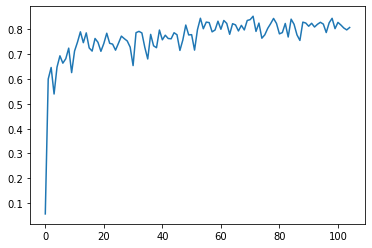

In [63]:
j_train = np.array(j_train)
j_test = np.array(j_test)
plt.plot(j_train)

Jaccard Index Over Test Set


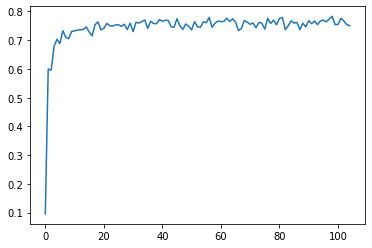

In [64]:

plt.plot(j_test)

Jaccard distribution over the Test Set

(array([ 3.,  0.,  4.,  2.,  4.,  4.,  8., 21., 38., 46.]),
 array([0.        , 0.0945885 , 0.189177  , 0.28376552, 0.378354  ,
        0.47294253, 0.56753105, 0.66211957, 0.756708  , 0.85129654,
        0.94588506], dtype=float32),
 <a list of 10 Patch objects>)

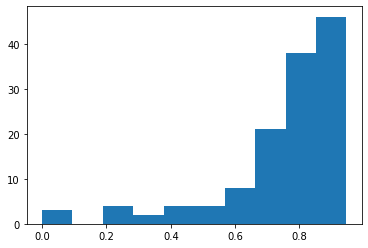

In [65]:
plt.hist(J_out[0])

Jaccard Distribution over the Training Set

(array([1., 0., 2., 1., 1., 0., 0., 6., 1., 4.]),
 array([0.61382127, 0.6430156 , 0.67221004, 0.7014044 , 0.73059875,
        0.75979316, 0.7889875 , 0.8181819 , 0.8473762 , 0.87657064,
        0.905765  ], dtype=float32),
 <a list of 10 Patch objects>)

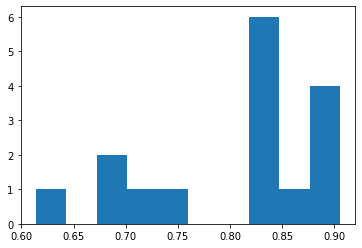

In [66]:
plt.hist(J_out_t[0])

Failure Rate on the Test Set

In [67]:
#failure rate on test set:
fails = 0
for a in J_out[0]:
  if a < 0.65:
    fails += 1
    
rate = fails/J_out[0].shape[0]
rate

0.19230769230769232

## Analyze Pigmentation


Only about 10% of the colour variation  comes from segmentation failure then

In [68]:
J_out[3].mean()

nan

/usr/local/lib/python3.6/dist-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/usr/local/lib/python3.6/dist-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)


(array([ 1.,  1.,  0.,  0.,  2.,  3.,  2., 10., 12., 98.]),
 array([0.06657461, 0.15991715, 0.2532597 , 0.34660223, 0.43994477,
        0.5332873 , 0.6266298 , 0.7199724 , 0.8133149 , 0.90665746,
        1.        ], dtype=float32),
 <a list of 10 Patch objects>)

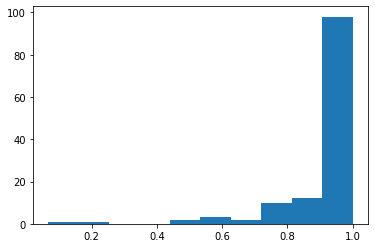

In [69]:
plt.hist(J_out[3])

This roughly representative of the distribution of the size of the spots compared to the size of the normal skin area in the melanoma dataset

(array([ 2.,  0.,  3.,  1.,  5.,  0., 12., 18., 35., 54.]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ],
       dtype=float32),
 <a list of 10 Patch objects>)

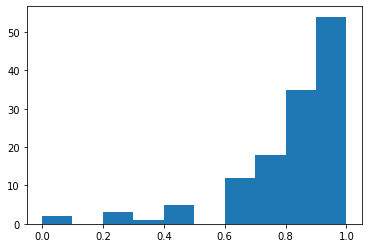

In [70]:
plt.hist(J_out[4])

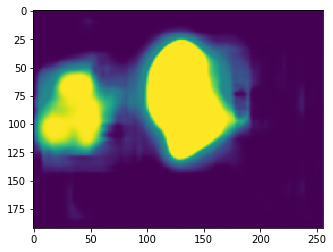

In [71]:
plt.imshow(pred_pigment[0][5,:,:])
plt.show()

In [72]:
pigs.shape

(28, 192, 256, 3)

In [73]:
pred_pigment[0].shape

(28, 192, 256)

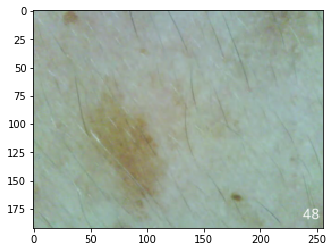

In [74]:
plt.imshow(pigs[0])
plt.show()

In [0]:
def visual_progress():

  mask = np.zeros([192,256,3])#np.vstack([pred_pigment[0],pred_pigment[0],pred_pigment[0]])
  for i in range(len(pred_pigment[0])):
    mask[:,:,0] = np.around(pred_pigment[0][i])
    mask[:,:,1] = np.around(pred_pigment[0][i])
    mask[:,:,2] = np.around(pred_pigment[0][i])


    image = pigs[i]
    plt.imshow(image)
    plt.show()
    notmask = 1- mask
    image2 = image*mask
    image1 = image*(1- mask)

    image2_avgr = np.average(image2[:,:,0], weights = mask[:,:,0])
    image2_avgg = np.average(image2[:,:,1], weights = mask[:,:,1]) 
    image2_avgb = np.average(image2[:,:,2], weights = mask[:,:,2])

    image1_avgr = np.average(image1[:,:,0], weights = notmask[:,:,0])
    image1_avgg = np.average(image1[:,:,1], weights = notmask[:,:,1]) 
    image1_avgb = np.average(image1[:,:,2], weights = notmask[:,:,2])


    if i==0:
      avgro= image2_avgr
      avggo = image2_avgg
      avgbo = image2_avgb

      navgro= image2_avgr
      navggo = image2_avgg
      navgbo = image2_avgb




    image2_avg = np.zeros(image2.shape)
    image1_avg = np.zeros(image1.shape)
    image2_avg[:,:,0] = image2_avgr
    image2_avg[:,:,1] = image2_avgg
    image2_avg[:,:,2] = image2_avgb

    image1_avg[:,:,0] = image1_avgr
    image1_avg[:,:,1] = image1_avgg
    image1_avg[:,:,2] = image1_avgb
#mask = 1-mask
#mask = mask.astype(int)
    plt.imshow(image2_avg)
    plt.show()
  
#image[mask] = 0

    plt.imshow(image1_avg)
    plt.show()

    plt.imshow(image2)
    plt.show()
    plt.imshow(image1)
    plt.show()

    print("next day..\n")
  return(avgro,avggo,avgbo,navgro,navggo,navgbo)

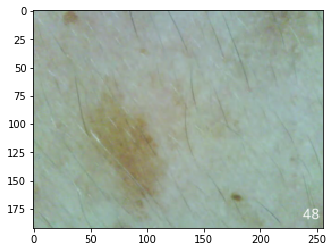

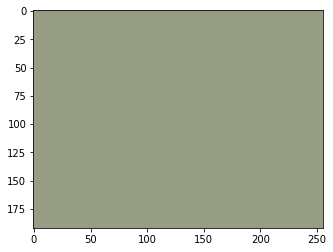

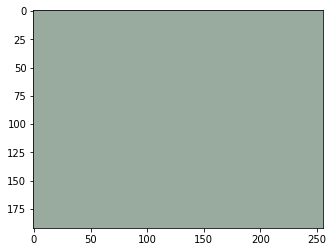

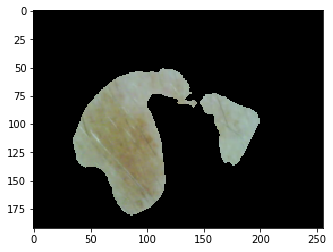

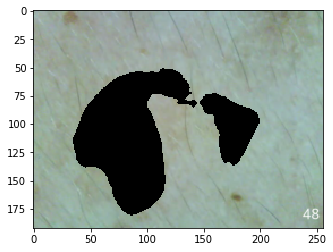

next day..



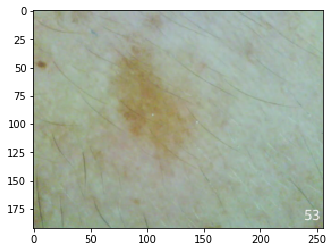

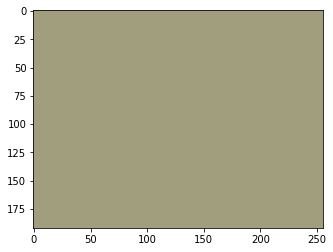

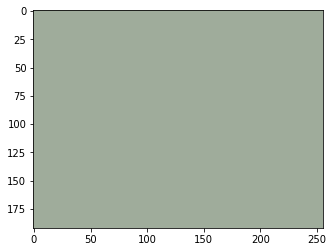

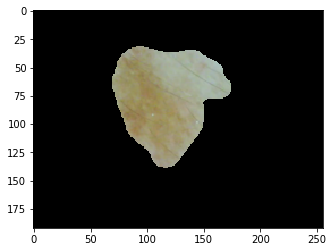

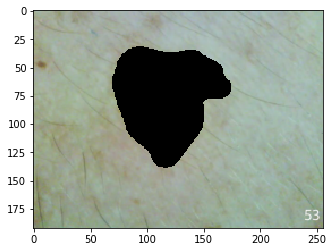

next day..



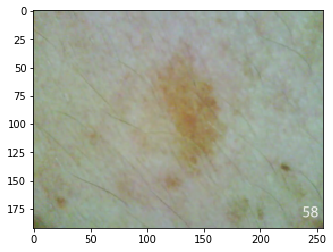

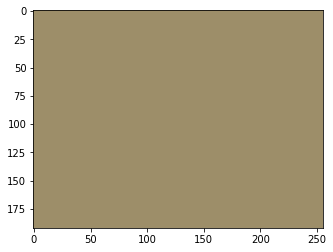

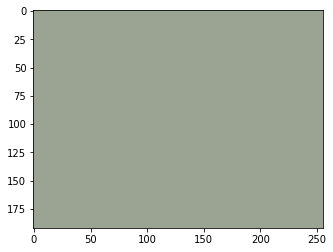

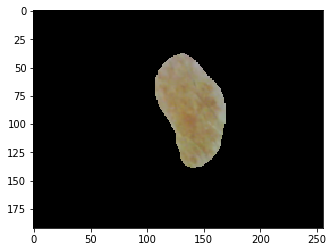

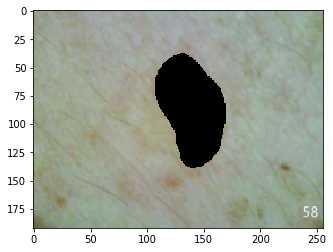

next day..



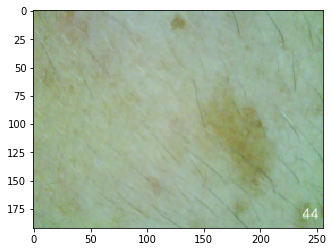

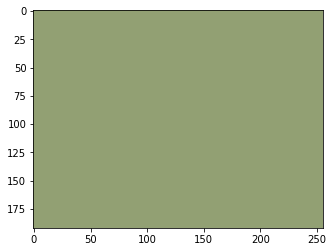

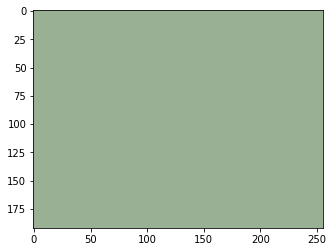

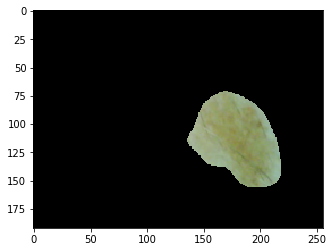

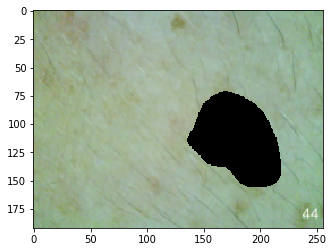

next day..



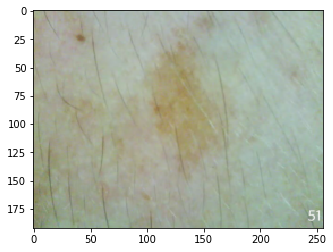

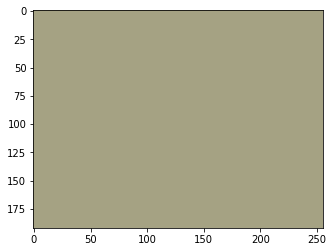

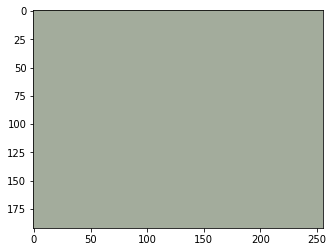

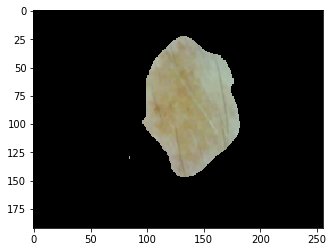

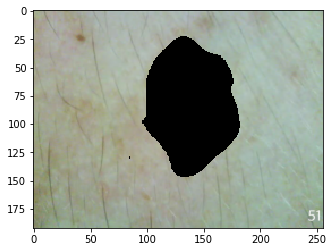

next day..



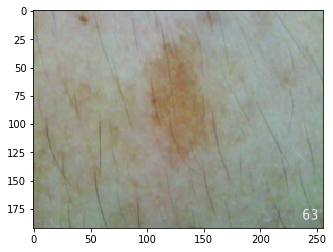

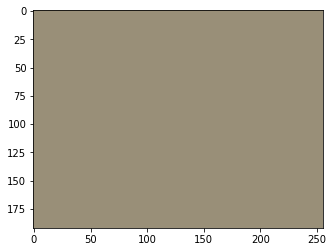

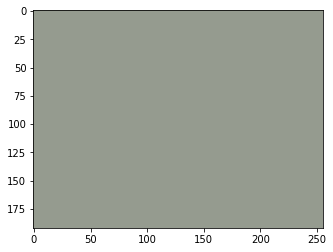

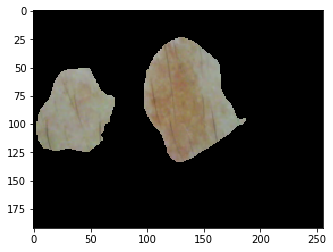

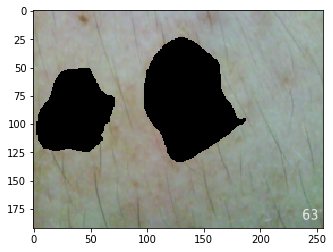

next day..



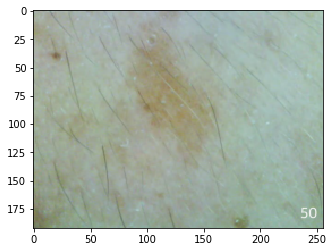

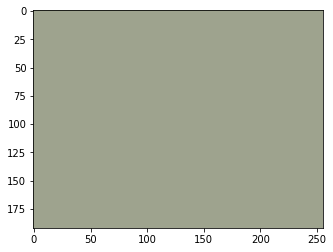

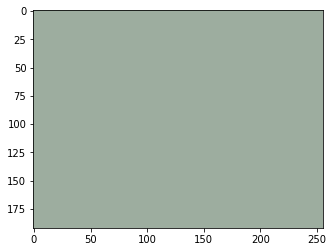

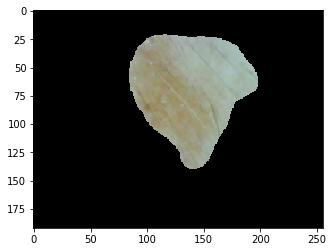

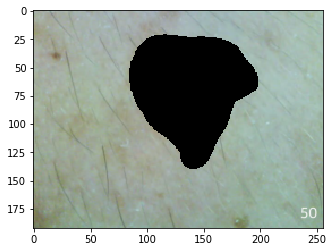

next day..



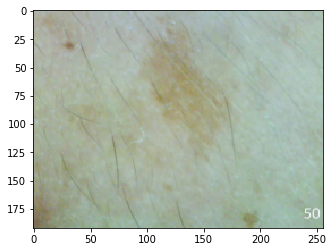

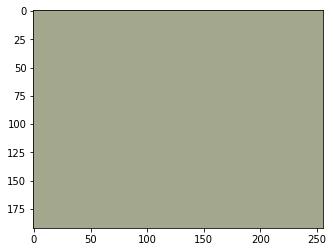

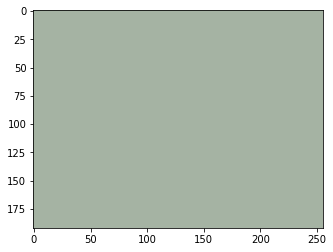

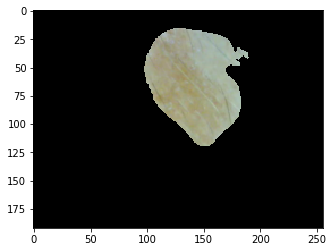

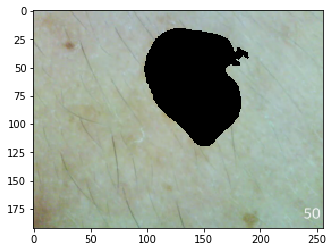

next day..



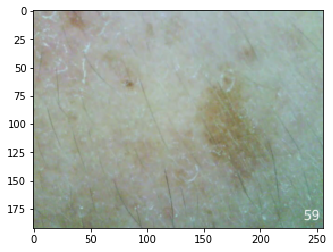

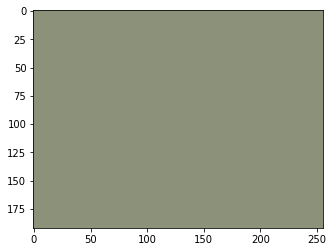

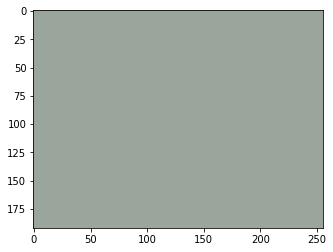

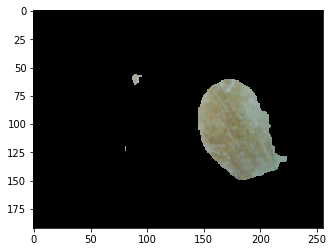

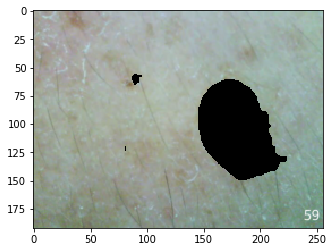

next day..



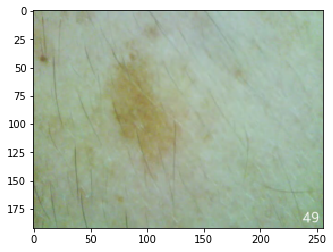

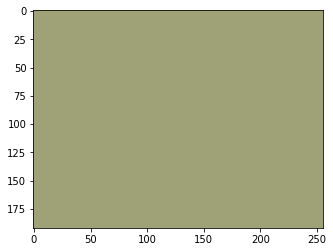

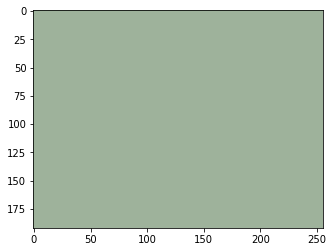

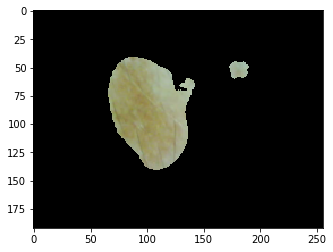

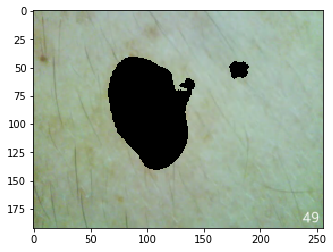

next day..



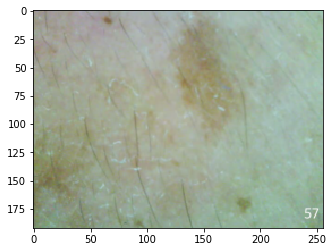

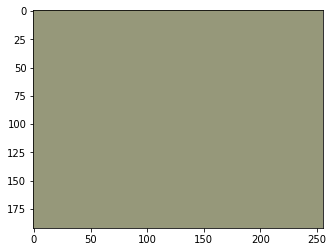

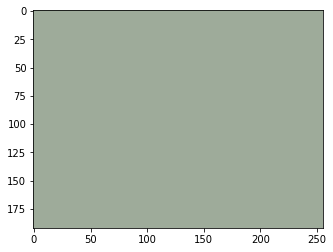

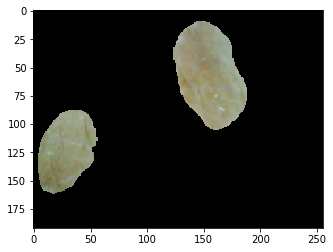

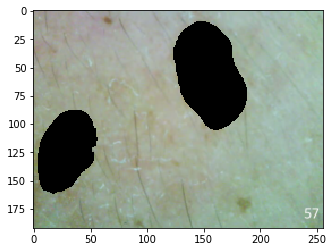

next day..



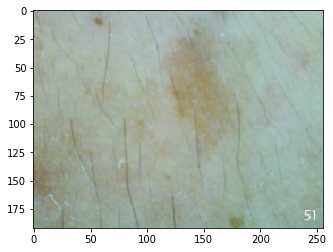

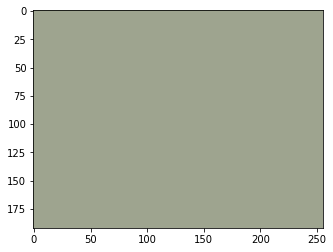

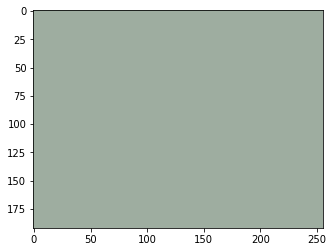

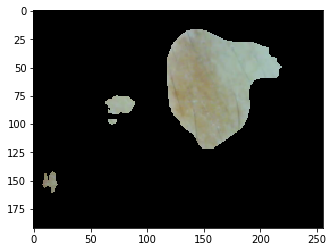

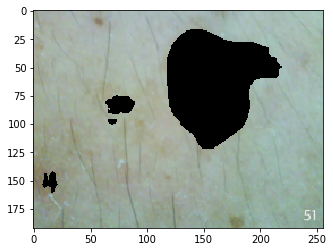

next day..



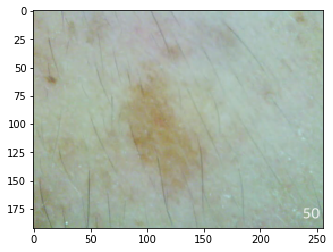

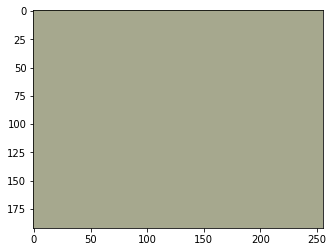

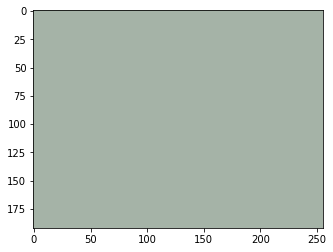

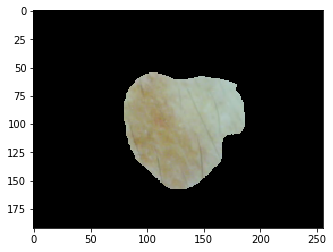

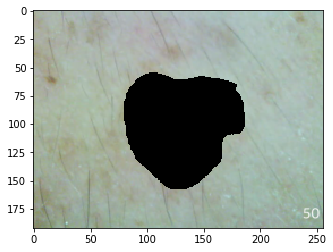

next day..



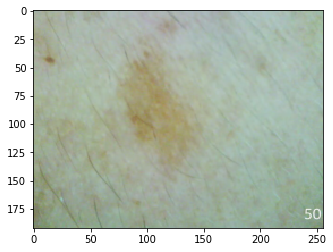

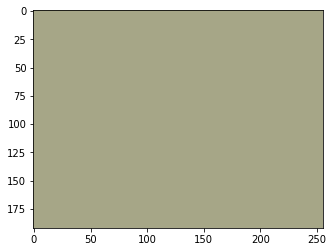

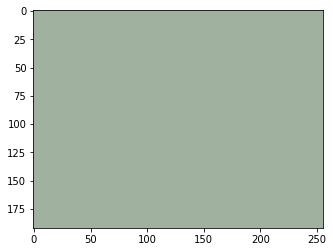

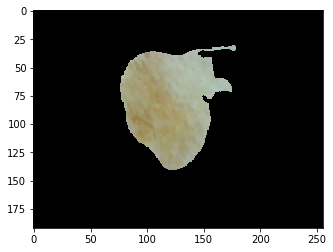

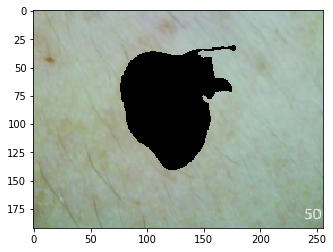

next day..



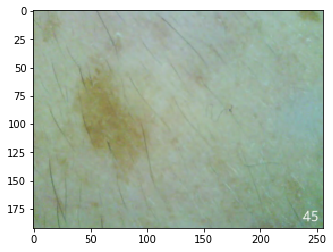

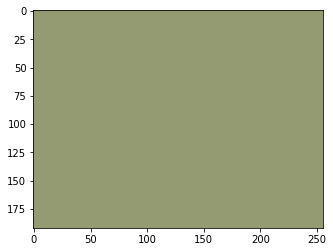

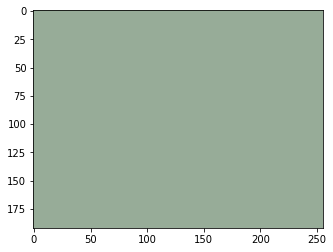

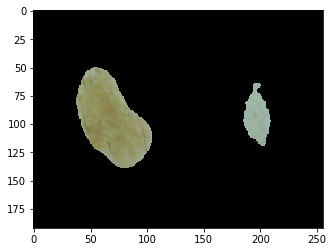

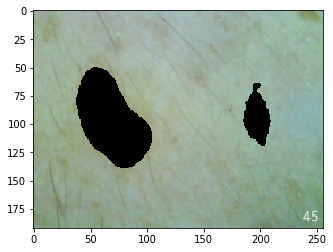

next day..



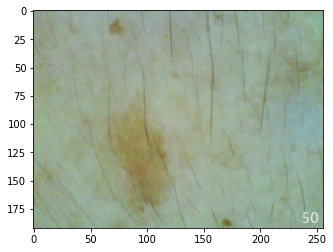

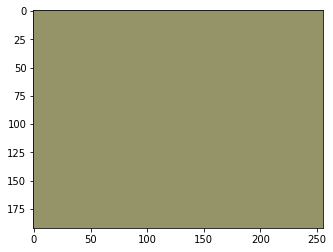

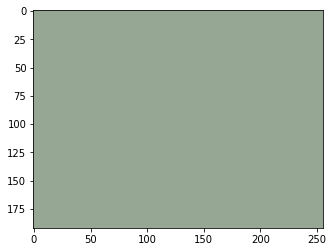

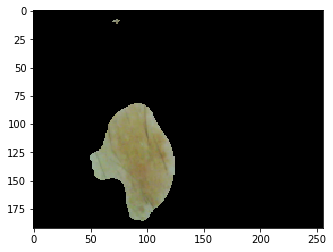

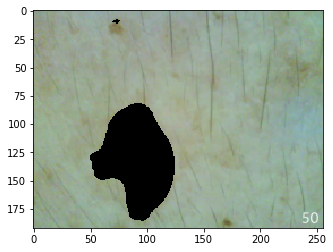

next day..



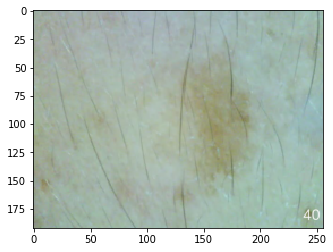

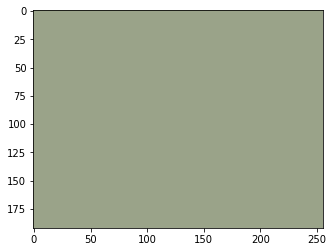

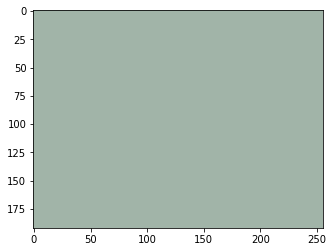

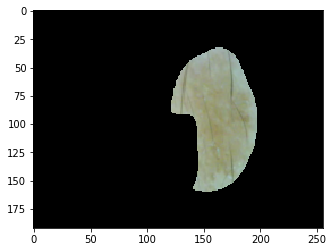

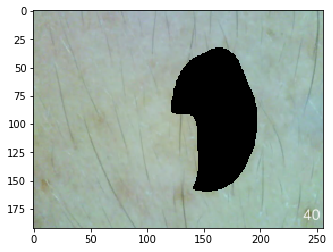

next day..



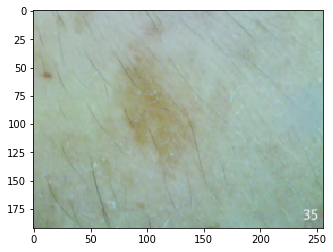

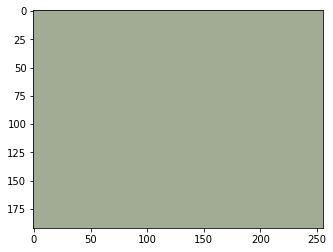

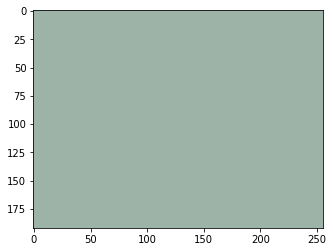

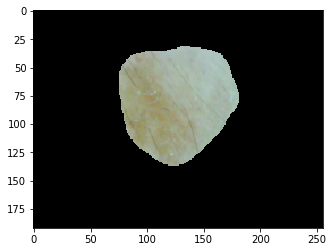

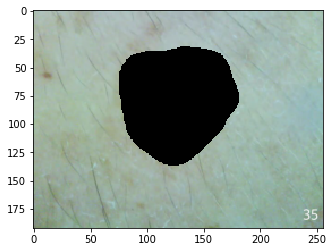

next day..



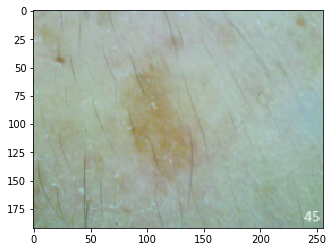

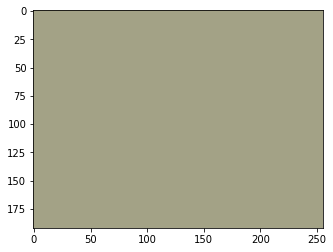

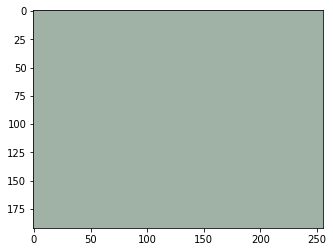

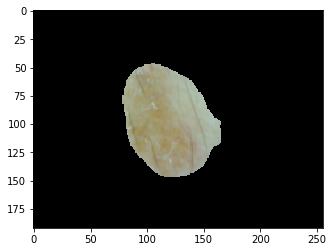

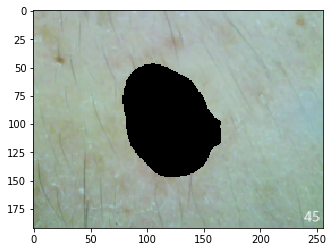

next day..



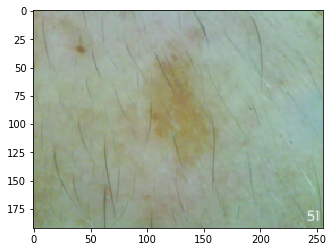

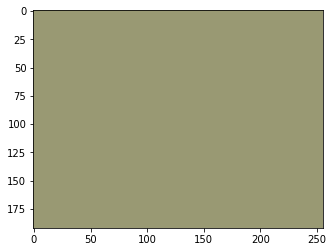

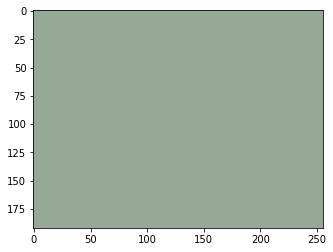

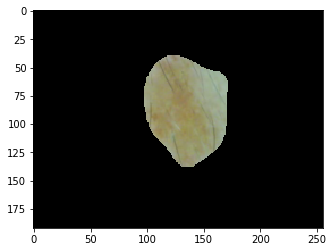

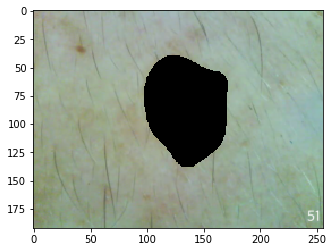

next day..



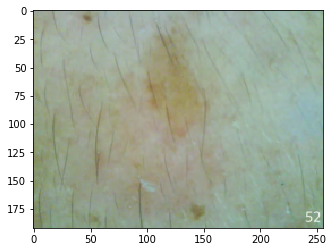

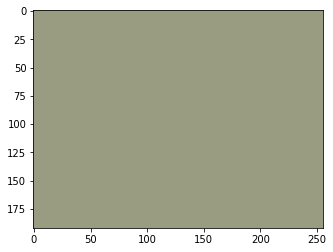

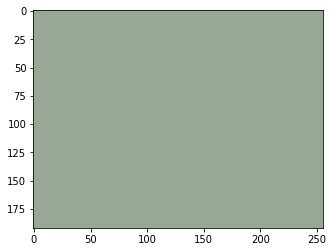

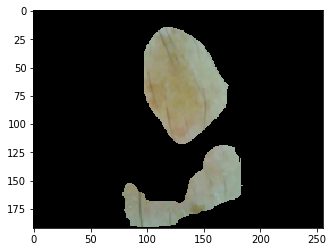

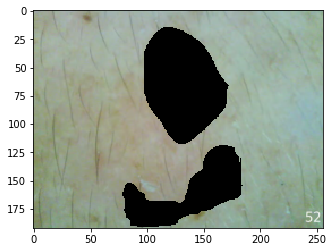

next day..



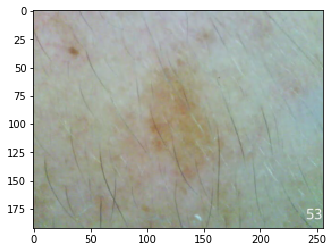

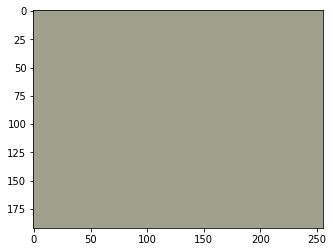

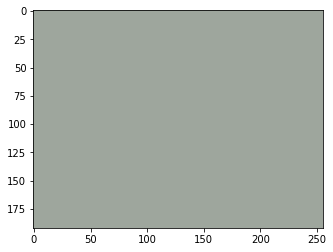

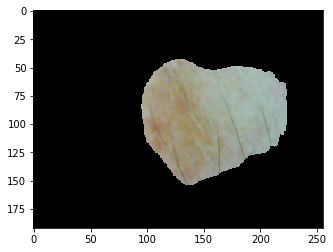

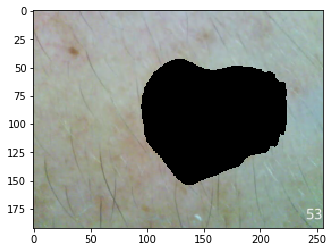

next day..



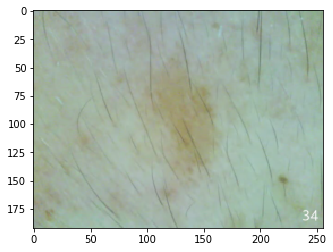

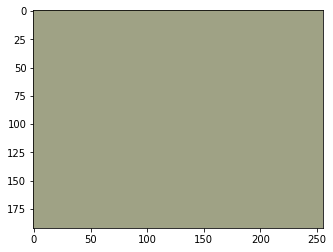

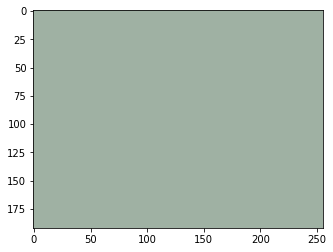

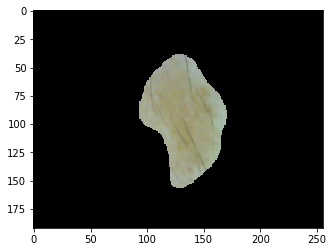

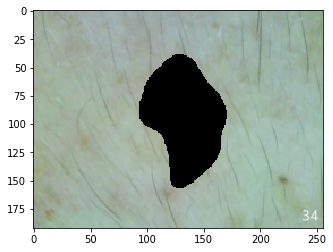

next day..



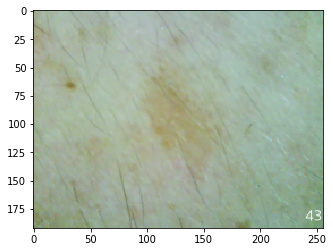

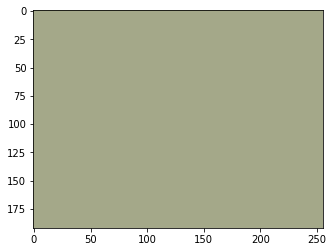

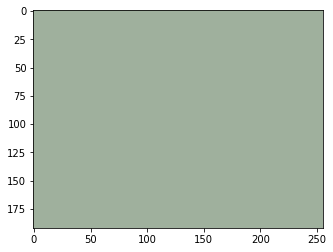

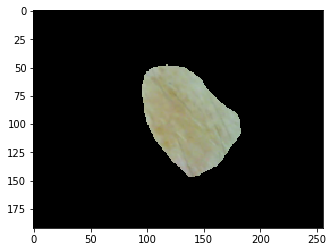

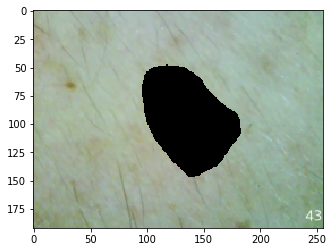

next day..



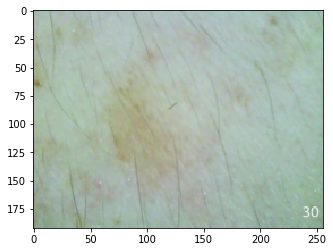

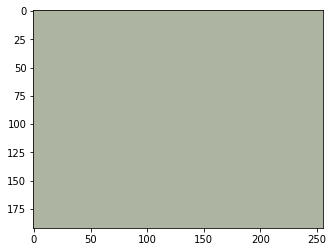

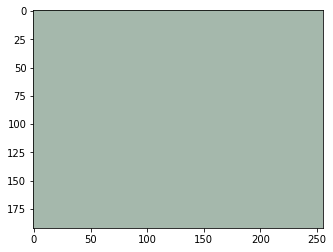

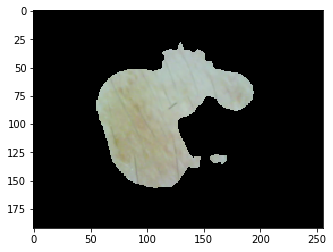

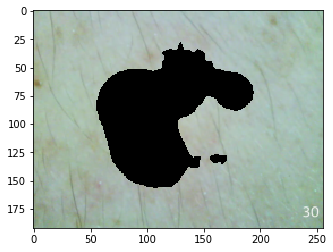

next day..



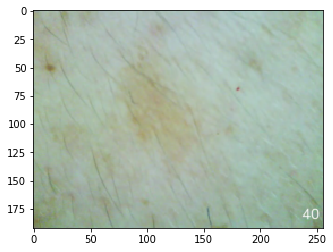

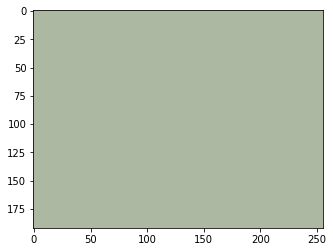

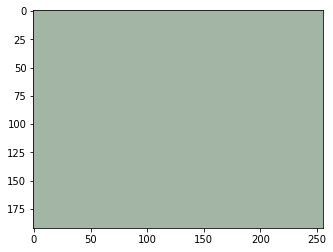

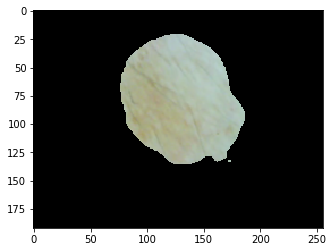

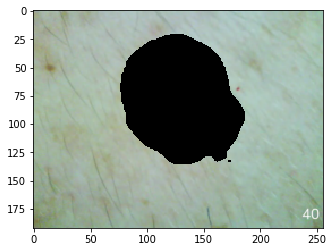

next day..



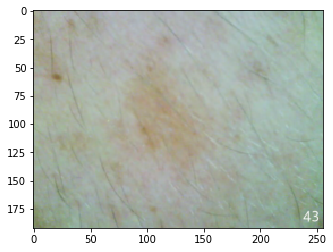

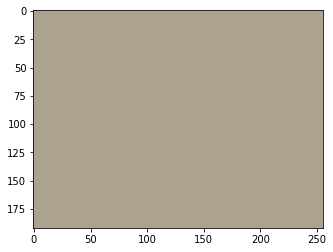

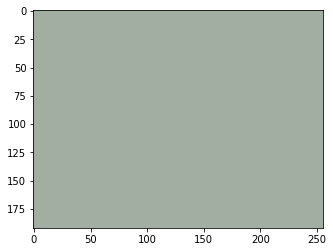

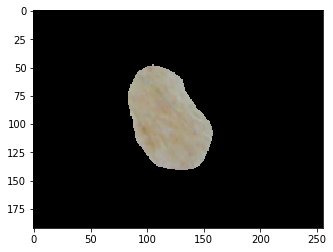

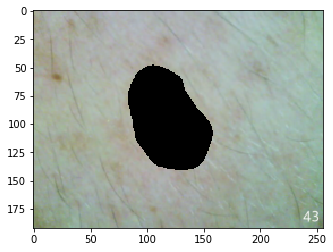

next day..



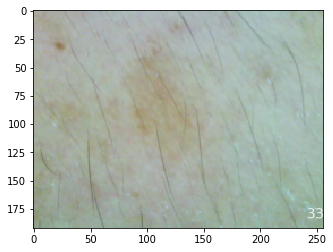

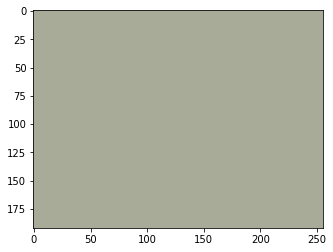

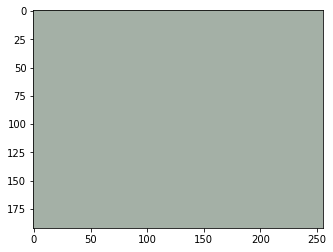

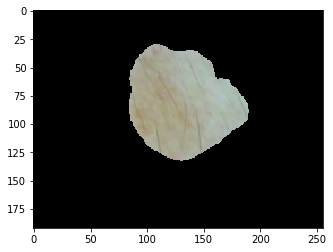

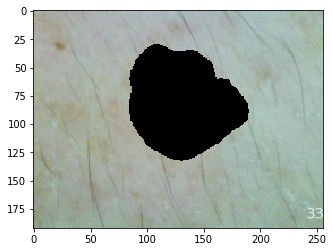

next day..



In [76]:
avgro, avggo, avgbo, navgro, navggo, navgbo  = visual_progress()

In [0]:
def measure_progress(pigs,masks):  ##changed to blue
    blue_pigs = []
    blue_norms = []
    imagesp = []
    imagesn = []
    i = 0
    for pig in pigs:
        mask = np.zeros([192,256,3])#np.vstack([pred_pigment[0],pred_pigment[0],pred_pigment[0]])
        mask[:,:,0] = pred_pigment[0][i,:,:]
        mask[:,:,1] = pred_pigment[0][i,:,:]
        mask[:,:,2] = pred_pigment[0][i,:,:]
        mask_inv = 1- mask
        imagep = pig*mask*255
        imagen = pig*(1- mask)*255
        imagesp += [imagep]
        imagesn += [imagen]
        blue_norm = imagen[:,:,2].reshape(-1)  #- 3*imagen[:,:,1].reshape(-1)/8
        blue_pig = imagep[:,:,2].reshape(-1)  # - 3*imagep[:,:,1].reshape(-1)/8

        #in next step subtract average at time 0 from these numbers and divide by average segmentation error
        #find average error by taking time 0 color of pigment and average with % segmentation error colour of normal, plus and minus, to find the value in bits (pixel values)
        #recompute the trajecotry in terms of movements away from day 1 in normalized terms
        #tag days with higher motion

        an = np.average(blue_norm, weights =mask_inv[:,:,0].reshape(-1))
        ap = np.average(blue_pig, weights =mask[:,:,0].reshape(-1))
        blue_pigs += [ap] 
        blue_norms += [an]
        i+=1
    blue_pigs = np.array(blue_pigs)
    blue_norms = np.array(blue_norms)
    return(blue_pigs, blue_norms, imagesp, imagesn)

In [0]:
def measure_progress_red(pigs,masks):  ##changed to blue
    blue_pigs = []
    blue_norms = []
    imagesp = []
    imagesn = []
    i = 0
    for pig in pigs:
        mask = np.zeros([192,256,3])#np.vstack([pred_pigment[0],pred_pigment[0],pred_pigment[0]])
        mask[:,:,0] = pred_pigment[0][i,:,:]
        mask[:,:,1] = pred_pigment[0][i,:,:]
        mask[:,:,2] = pred_pigment[0][i,:,:]
        mask_inv = 1- mask
        imagep = pig*mask*255
        imagen = pig*(1- mask)*255
        imagesp += [imagep]
        imagesn += [imagen]
        blue_norm = imagen[:,:,0].reshape(-1)  #- 3*imagen[:,:,1].reshape(-1)/8
        blue_pig = imagep[:,:,0].reshape(-1)  # - 3*imagep[:,:,1].reshape(-1)/8

        #in next step subtract average at time 0 from these numbers and divide by average segmentation error
        #find average error by taking time 0 color of pigment and average with % segmentation error colour of normal, plus and minus, to find the value in bits (pixel values)
        #recompute the trajecotry in terms of movements away from day 1 in normalized terms
        #tag days with higher motion

        an = np.average(blue_norm, weights =mask_inv[:,:,0].reshape(-1))
        ap = np.average(blue_pig, weights =mask[:,:,0].reshape(-1))
        blue_pigs += [ap] 
        blue_norms += [an]
        i+=1
    blue_pigs = np.array(blue_pigs)
    blue_norms = np.array(blue_norms)
    return(blue_pigs, blue_norms, imagesp, imagesn)

In [0]:
pigmented, normal, imagesp, imagesn = measure_progress(pigs,pred_pigment)

In [0]:
pigmentedr, normalr, imagespr, imagesnr = measure_progress_red(pigs,pred_pigment)

In [80]:
J_out[1].shape

(130, 192, 256)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


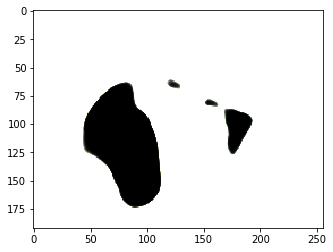

In [81]:
plt.imshow(imagesn[0])

In [82]:
pigmented

array([103.71847561, 104.34242352,  85.12895678,  93.79947094,
       108.85384373,  94.99695663, 120.97600239, 113.3562174 ,
        93.4291569 ,  95.6853329 ,  99.39098341, 109.76024789,
       122.56628864, 104.69299882,  87.74753936,  83.73437686,
       109.56053321, 128.81755221, 109.94305725,  97.07608382,
        99.71082576, 121.64811239, 108.28601778, 109.03209195,
       128.23728103, 138.47762217, 113.44811196, 125.24175098])

In [83]:
normal

array([150.8318472 , 150.67368462, 143.92404912, 145.58378526,
       150.70141891, 134.8626739 , 153.55993845, 156.90976571,
       151.39256943, 150.79562756, 148.7068057 , 152.67086744,
       161.85733659, 153.78167098, 148.19913781, 143.92314887,
       162.0193913 , 161.48234677, 160.40627096, 146.38585309,
       140.44605466, 150.50032262, 158.18492153, 151.59771185,
       162.32811684, 159.30911777, 158.23376354, 160.0105544 ])

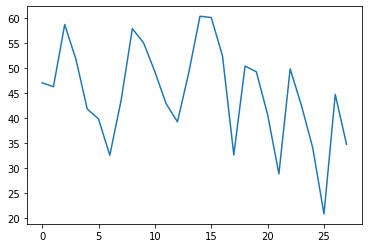

In [84]:
plt.plot(normal - pigmented)

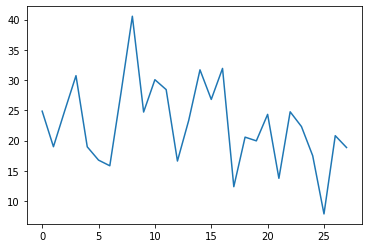

In [140]:
plt.plot(normalr - pigmentedr)

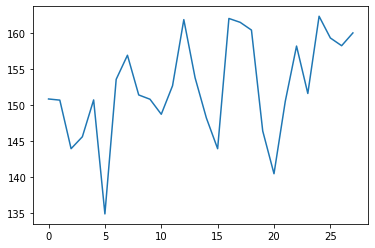

In [85]:
plt.plot(normal)

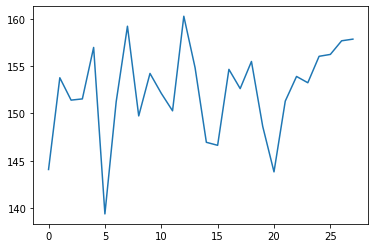

In [141]:
plt.plot(normalr)

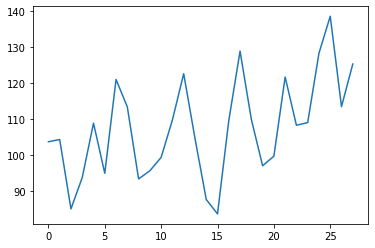

In [86]:
plt.plot(pigmented)

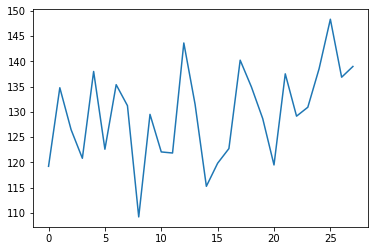

In [142]:
plt.plot(pigmentedr)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


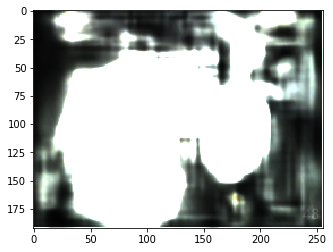

In [87]:
plt.imshow(imagesp[0])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


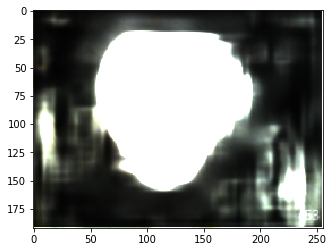

In [88]:
plt.imshow(imagesp[1])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


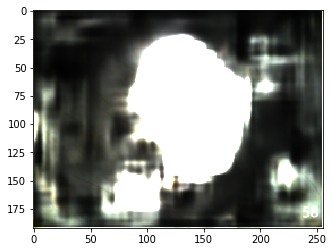

In [89]:
plt.imshow(imagesp[2])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


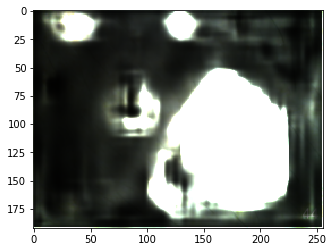

In [90]:
plt.imshow(imagesp[3])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


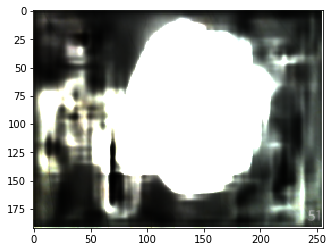

In [91]:
plt.imshow(imagesp[4])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


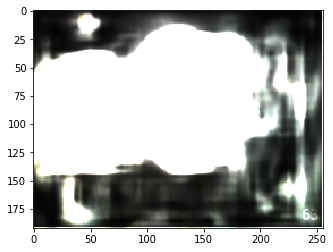

In [92]:
plt.imshow(imagesp[5])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


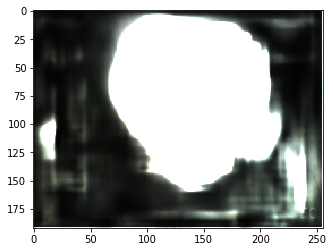

In [93]:
plt.imshow(imagesp[6])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


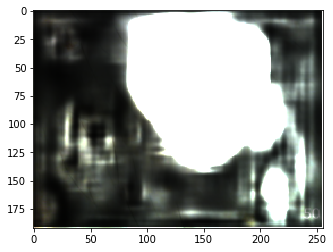

In [94]:
plt.imshow(imagesp[7])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


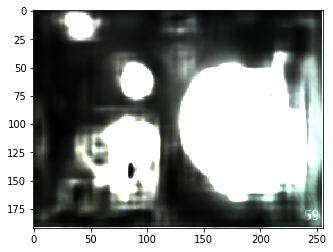

In [95]:
plt.imshow(imagesp[8])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


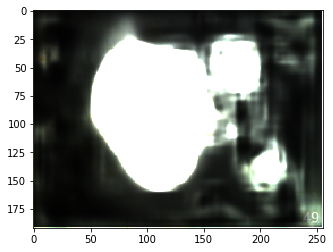

In [96]:
plt.imshow(imagesp[9])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


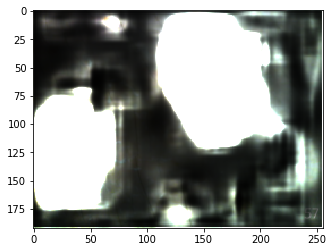

In [97]:
plt.imshow(imagesp[10])

In [98]:
pigmented[0]

103.71847561236088

In [99]:
pigmented[10]

99.39098341444387

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


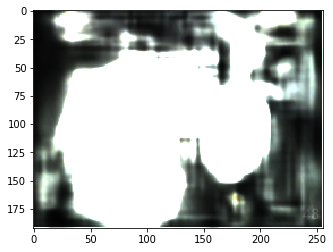

In [100]:
plt.imshow(imagesp[0])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


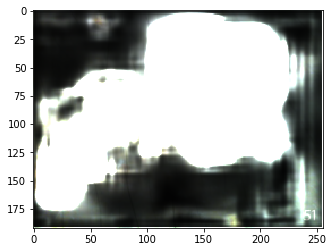

In [101]:
plt.imshow(imagesp[11])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


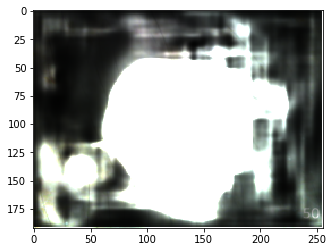

In [102]:
plt.imshow(imagesp[12])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


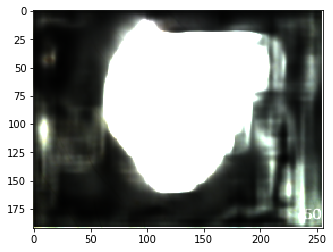

In [103]:
plt.imshow(imagesp[13])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


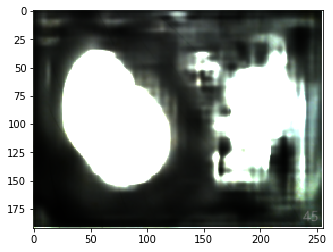

In [104]:
plt.imshow(imagesp[14])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


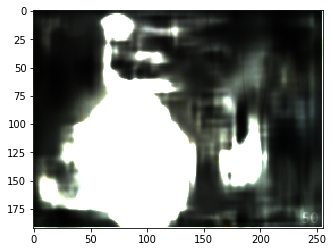

In [105]:
plt.imshow(imagesp[15])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


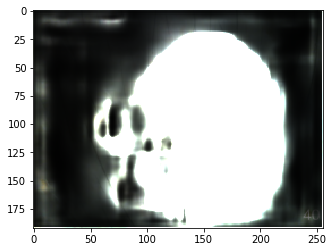

In [106]:
plt.imshow(imagesp[16])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


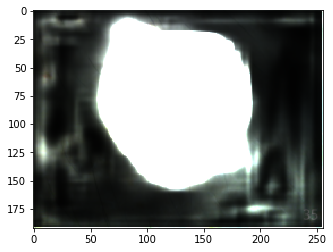

In [107]:
plt.imshow(imagesp[17])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


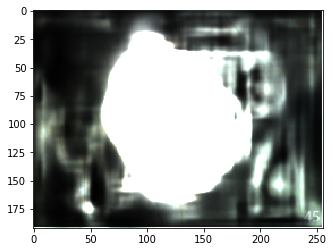

In [108]:
plt.imshow(imagesp[18])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


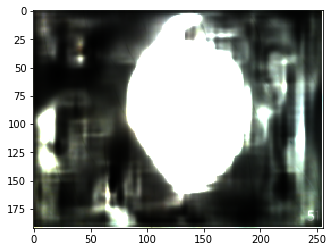

In [109]:
plt.imshow(imagesp[19])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


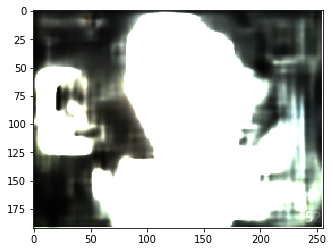

In [110]:
plt.imshow(imagesp[20])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


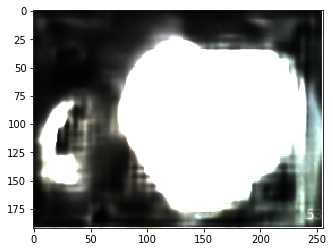

In [111]:
plt.imshow(imagesp[21])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


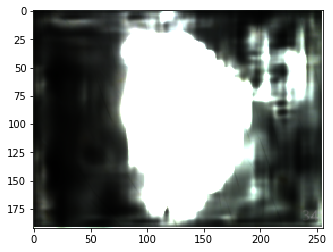

In [112]:
plt.imshow(imagesp[22])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


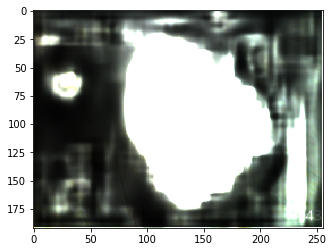

In [113]:
plt.imshow(imagesp[23])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


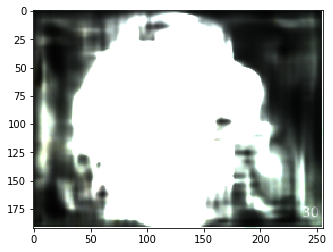

In [114]:
plt.imshow(imagesp[24])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


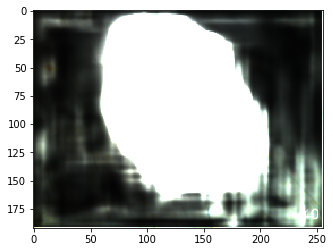

In [115]:
plt.imshow(imagesp[25])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


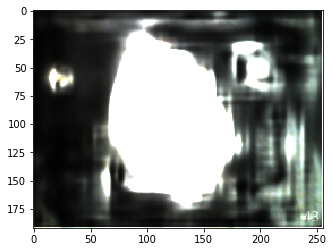

In [116]:
plt.imshow(imagesp[26])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


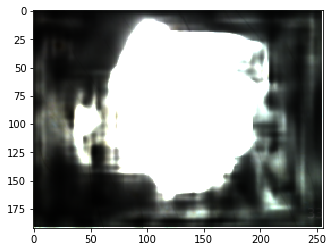

In [117]:
plt.imshow(imagesp[27])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


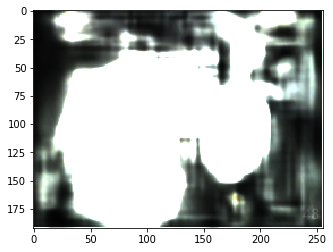

In [118]:
plt.imshow(imagesp[0])

In [0]:
test = normal - pigmented

In [0]:
test = np.hstack([test[0:2], test[4:8], test[9:21], test[22:26], test[27]])

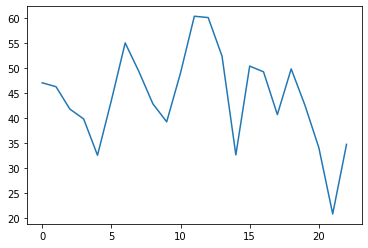

In [121]:
plt.plot(test)

In [122]:
filenames

['ISIC_0000000r_segmentation.png',
 'ISIC_0000000f_segmentation.png',
 'ISIC_0000000_segmentation.png',
 'ISIC_0000001f_segmentation.png',
 'ISIC_0000008r_segmentation.png',
 'ISIC_0000008_segmentation.png',
 'ISIC_0000007_segmentation.png',
 'ISIC_0000001_segmentation.png',
 'ISIC_0000007r_segmentation.png',
 'ISIC_0000008f_segmentation.png',
 'ISIC_0000001r_segmentation.png',
 'ISIC_0000007f_segmentation.png',
 'ISIC_0000016r_segmentation.png',
 'ISIC_0000016f_segmentation.png',
 'ISIC_0000016_segmentation.png',
 'ISIC_0000024f_segmentation.png',
 'ISIC_0000024_segmentation.png',
 'ISIC_0000025f_segmentation.png',
 'ISIC_0000024r_segmentation.png',
 'ISIC_0000029r_segmentation.png',
 'ISIC_0000029_segmentation.png',
 'ISIC_0000028r_segmentation.png',
 'ISIC_0000025r_segmentation.png',
 'ISIC_0000025_segmentation.png',
 'ISIC_0000029f_segmentation.png',
 'ISIC_0000028f_segmentation.png',
 'ISIC_0000028_segmentation.png',
 'ISIC_0000031r_segmentation.png',
 'ISIC_0000031f_segmentation.

In [0]:
normal = np.hstack([normal[0:2], normal[12], normal[21:28], normal[2:12], normal[13:20]])

In [0]:
pigmented = np.hstack([pigmented[0:2], pigmented[12], pigmented[21:28], pigmented[2:12], pigmented[13:20]])

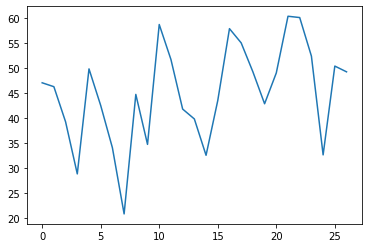

In [125]:
plt.plot(normal-pigmented)

In [0]:
## 26, 21, 2, 3, 8 -> 8,3,10,11,16

In [127]:
normal.shape

(27,)

In [0]:
normal = np.hstack([normal[0:3], normal[4:8], normal[9], normal[12:16], normal[17:27]])

In [0]:
pigmented = np.hstack([pigmented[0:3], pigmented[4:8], pigmented[9], pigmented[12:16], pigmented[17:27]])

In [0]:
new_files_names = np.hstack([filenames[0:3], filenames[4:8], filenames[9], filenames[12:16], filenames[17:27]])

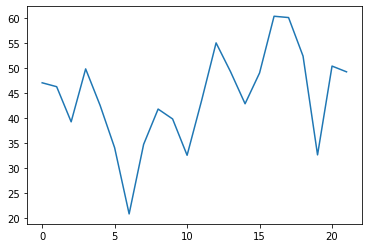

In [131]:
plt.plot(normal-pigmented)

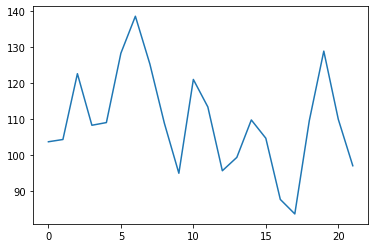

In [132]:
plt.plot(pigmented)

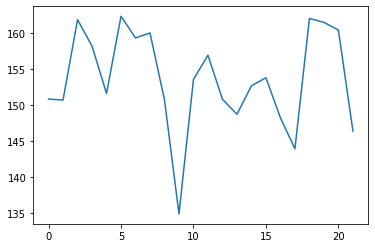

In [133]:
plt.plot(normal)

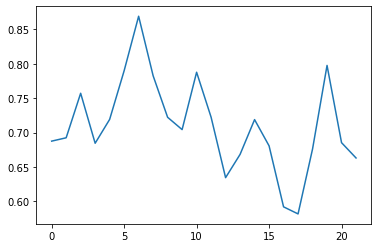

In [134]:
plt.plot(pigmented/normal)

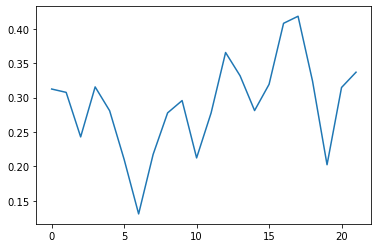

In [135]:
plt.plot((normal - pigmented)/normal)

In [136]:
new_files_names

array(['ISIC_0000000r_segmentation.png', 'ISIC_0000000f_segmentation.png',
       'ISIC_0000000_segmentation.png', 'ISIC_0000008r_segmentation.png',
       'ISIC_0000008_segmentation.png', 'ISIC_0000007_segmentation.png',
       'ISIC_0000001_segmentation.png', 'ISIC_0000008f_segmentation.png',
       'ISIC_0000016r_segmentation.png', 'ISIC_0000016f_segmentation.png',
       'ISIC_0000016_segmentation.png', 'ISIC_0000024f_segmentation.png',
       'ISIC_0000025f_segmentation.png', 'ISIC_0000024r_segmentation.png',
       'ISIC_0000029r_segmentation.png', 'ISIC_0000029_segmentation.png',
       'ISIC_0000028r_segmentation.png', 'ISIC_0000025r_segmentation.png',
       'ISIC_0000025_segmentation.png', 'ISIC_0000029f_segmentation.png',
       'ISIC_0000028f_segmentation.png', 'ISIC_0000028_segmentation.png'],
      dtype='<U30')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


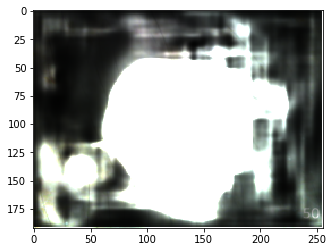

In [137]:
plt.imshow(imagesp[12])